## Radar

/tmp/ipykernel_3238631/3358286713.py:52: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-muted')


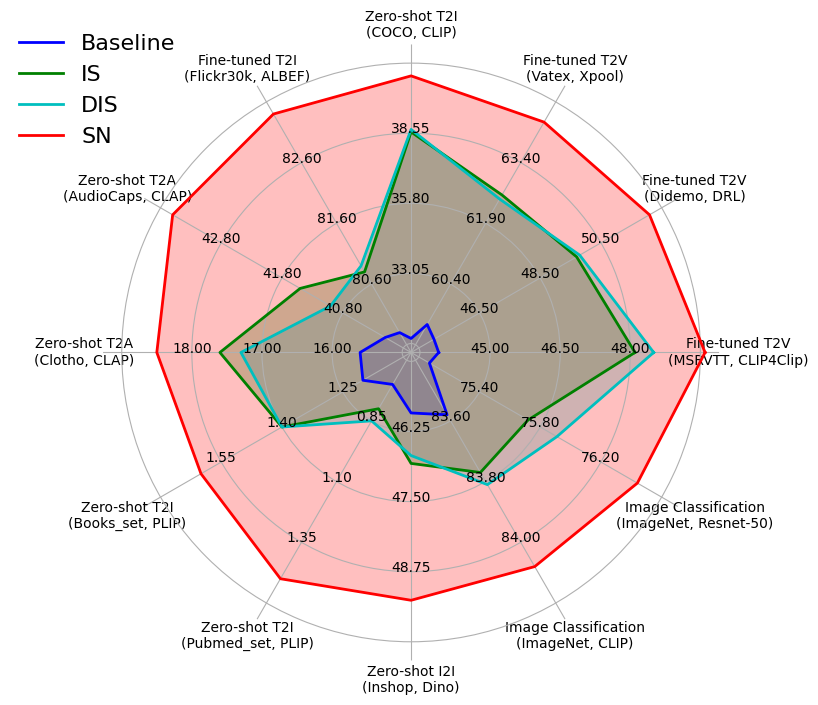

In [16]:
## TODO:

import numpy as np
import matplotlib.pyplot as plt
from math import pi
# plt.rcParams['font.family'] = 'Times New Roman'

legend_font = {
    # 'family': 'Arial', # 字体
    # 'style': 'normal', # 样式
    'size': 16, # 字号
    'weight': 'normal' # 是否加粗
}

# 数据
labels = ['Fine-tuned T2V\n(MSRVTT, CLIP4Clip)', 'Fine-tuned T2V\n(Didemo, DRL)', 'Fine-tuned T2V\n(Vatex, Xpool)', 
          'Zero-shot T2I\n(COCO, CLIP)', 'Fine-tuned T2I\n(Flickr30k, ALBEF)',
          'Zero-shot T2A\n(AudioCaps, CLAP)', 'Zero-shot T2A\n(Clotho, CLAP)',
          'Zero-shot T2I\n(Books_set, PLIP)', 'Zero-shot T2I\n(Pubmed_set, PLIP)',
          'Zero-shot I2I\n(Inshop, Dino)',
          'Image Classification\n(ImageNet, CLIP)', 'Image Classification\n(ImageNet, Resnet-50)', 
          ]

# 59.4 62.6 64.4
# 每个模型的数据
data = {
    'Baseline'        : [43.9, 45.0, 59.4, 30.5, 79.8, 40.1, 15.6, 1.2, 0.7, 45.92, 83.58, 75.07],
    'IS': [48.1, 49.7, 62.6, 38.6, 80.8, 41.5, 17.6, 1.4, 0.8, 46.82, 83.77, 75.72],
    'DIS': [48.5, 49.8, 62.5, 38.7, 80.9, 41.0, 17.3, 1.4, 0.85, 46.68, 83.81, 75.91],
    'SN': [49.6, 52.1, 64.4, 40.8, 83.4, 43.6, 18.5, 1.6, 1.5, 49.26, 84.08, 76.44],
}

# 'Baseline'  
# 'Inverted Softmax'
# 'Sinkhorn Normalization'

scales=[
    46.5, 48.5, 61.9, 35.8, 81.6, 41.8, 17.0, 1.4, 1.1, 47.5, 83.8, 75.8,
]
bias=[
    3, 4, 3, 5.5, 2, 2, 2, 0.3, 0.5, 2.5, 0.4, 0.8,
]

## 排除 cars
# labels=[v for i,v in enumerate(labels) if i!=7]
# data={k:v[:7]+v[8:] for k,v in data.items()}
# scales=[v for i,v in enumerate(scales) if i!=7]
# bias=[v for i,v in enumerate(bias) if i!=7]
num_vars = len(labels)

# 设置图形样式
plt.style.use('seaborn-muted')

# 设置雷达图的角度
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# 完成雷达图
angles += angles[:1]

# 创建子图
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# 绘制每个模型的数据
colors = ["b","g","c","red"]

for i,(model, values) in enumerate(data.items()):
    color = colors[i]
    values = [(v-scales[i])/bias[i] for i,v in enumerate(values)]
    values += values[:1]
    ax.fill(angles, values, alpha=0.25, color=color)
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=model, color=color)


# 去除外圈
ax.spines['polar'].set_visible(False)


# 添加标签
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=10)

# 隐去部分刻度线
# ax.yaxis.set_tick_params(size=0)  # 隐去所有的刻度线

# 只显示特定的刻度标签
yticks = [-1, -0.5, 0, 0.5, 1]
ax.set_yticks(yticks)  # 
ax.set_yticklabels([])

## 设置刻度
for ytick in yticks[1:-1]:
    for i, angle in enumerate(angles[:-1]):
        label = "%.2f"%(scales[i]+bias[i]*ytick)
        # ax.text(angle, 0, label, horizontalalignment='center', size=10, color='black', weight='semibold')
        ax.text(angle, ytick, label, horizontalalignment='center', size=10, color='black')

# 添加图例
plt.legend(loc='upper right', bbox_to_anchor=(0.15, 1.05), prop=legend_font,frameon=False)
# plt.legend()

# 显示图形
plt.show()

/tmp/ipykernel_3215243/1101009036.py:51: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-muted')


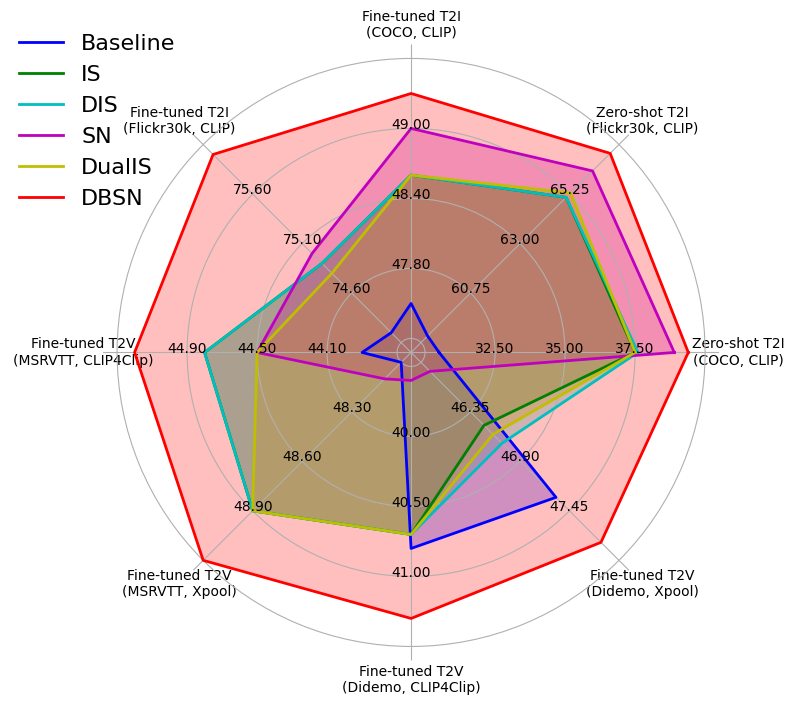

In [9]:
## TODO:

import numpy as np
import matplotlib.pyplot as plt
from math import pi
# plt.rcParams['font.family'] = 'Times New Roman'

legend_font = {
    # 'family': 'Arial', # 字体
    # 'style': 'normal', # 样式
    'size': 16, # 字号
    'weight': 'normal' # 是否加粗
}

# 数据
labels = ['Zero-shot T2I\n(COCO, CLIP)', 'Zero-shot T2I\n(Flickr30k, CLIP)', 
          'Fine-tuned T2I\n(COCO, CLIP)', 'Fine-tuned T2I\n(Flickr30k, CLIP)', 
          'Fine-tuned T2V\n(MSRVTT, CLIP4Clip)', 'Fine-tuned T2V\n(MSRVTT, Xpool)', 
          'Fine-tuned T2V\n(Didemo, CLIP4Clip)', 'Fine-tuned T2V\n(Didemo, Xpool)', 
          ]

# 59.4 62.6 64.4
# 每个模型的数据
data = {
    'Baseline': [30.5, 58.8, 47.5, 74.2, 43.9, 48.0, 40.8,47.3],
    'IS': [37.5, 65.1, 48.6, 74.9, 44.8, 48.9, 40.7,46.5],
    'DIS': [37.6, 65.1, 48.6, 74.9, 44.8, 48.9, 40.7,46.7],
    'SN': [38.9, 66.3, 49.0, 75.0, 44.5, 48.1, 39.6,45.9],
    'DualIS': [37.5, 65.3, 48.6, 74.8, 44.5, 48.9, 40.7,46.6],
    'DBSN': [39.4, 67.1, 49.3, 76.0, 45.2, 49.2, 41.3,47.8],
}
# 'Baseline'  
# 'Inverted Softmax'
# 'Sinkhorn Normalization'

scales=[ 
    35, 63, 48.4, 75.1, 44.5, 48.6, 40.5, 46.9
]
bias=[
    5, 4.5, 1.2, 1.0, 0.8, 0.6, 1.0, 1.1
]

## 排除 cars
# labels=[v for i,v in enumerate(labels) if i!=7]
# data={k:v[:7]+v[8:] for k,v in data.items()}
# scales=[v for i,v in enumerate(scales) if i!=7]
# bias=[v for i,v in enumerate(bias) if i!=7]
num_vars = len(labels)

# 设置图形样式
plt.style.use('seaborn-muted')

# 设置雷达图的角度
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# 完成雷达图
angles += angles[:1]

# 创建子图
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

# 绘制每个模型的数据
colors = ["b","g","c","m","y","r"]
for i,(model, values) in enumerate(data.items()):
    color = colors[i]
    values = [(v-scales[i])/bias[i] for i,v in enumerate(values)]
    values += values[:1]
    ax.fill(angles, values, alpha=0.25, color=color)
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=model, color=color)


# 去除外圈
ax.spines['polar'].set_visible(False)


# 添加标签
ax.set_xticks(angles[:-1])
ax.set_xticklabels(labels, fontsize=10)

# 隐去部分刻度线
# ax.yaxis.set_tick_params(size=0)  # 隐去所有的刻度线

# 只显示特定的刻度标签
yticks = [-1, -0.5, 0, 0.5, 1]
ax.set_yticks(yticks)  # 
ax.set_yticklabels([])

## 设置刻度
for ytick in yticks[1:-1]:
    for i, angle in enumerate(angles[:-1]):
        label = "%.2f"%(scales[i]+bias[i]*ytick)
        # ax.text(angle, 0, label, horizontalalignment='center', size=10, color='black', weight='semibold')
        ax.text(angle, ytick, label, horizontalalignment='center', size=10, color='black', )

# 添加图例
plt.legend(loc='upper right', bbox_to_anchor=(0.15, 1.05), fontsize=16,frameon=False)
# plt.legend()

# 显示图形
plt.show()

## IS & SN & DBSN

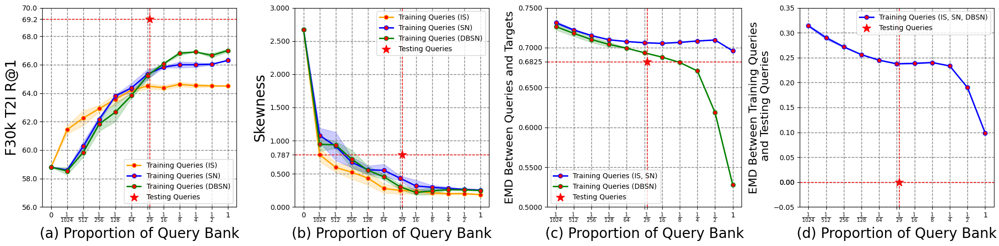

In [7]:
import math
import numpy as np
import matplotlib.pyplot as plt

# 准备数据
data_list = [
    {
        "cood_label": ("(a) Proportion of Query Bank","F30k T2I R@1"),
        "is":{
            0: [58.8, 58.8, 58.8],
            1: [61.6, 61.4, 61.6, 60.9, 61.8, 61.3,],
            2: [63.1, 61.9, 61.6, 62.8, 62.1, 62.0,],
            3: [63.1, 62.8, 62.6, 62.7, 63.1, 63.2,],
            4: [63.8, 64.2, 63.0, 63.4, 63.3, 63.7,],
            5: [64.3, 64.2, 63.8, 64.3, 64.3, 64.4,],
            6: [64.7, 64.2, 64.3, 64.7, 64.5, 64.6,],
            7: [64.5, 64.5, 64.2, 64.6, 64.2, 64.3,],
            8: [64.4, 64.5, 64.9, 64.6, 64.6, 64.7,],
            9: [64.5, 64.4, 64.6, 64.5, 64.4, 64.8,],
            10: [64.4, 64.5, 64.6, 64.6, 64.5, 64.5,],
            11: [64.5, 64.5, 64.5, 64.5, 64.5, 64.5,],
        },
        "sn": {
            0: [58.8, 58.8, 58.8],
            1: [58.7, 58.5, 58.6],
            2: [59.9, 60.2, 60.7],
            3: [62.0, 62.1, 62.4],
            4: [63.7, 63.8, 63.9],
            5: [64.6, 64.6, 63.9],
            6: [65.2, 65.0, 65.8],
            7: [65.8, 65.9, 65.8],
            8: [66.1, 66.2, 65.7],
            9: [65.8, 66.2, 66.0],
            10: [66.0, 66.1, 66.0],
            11: [66.3, 66.3, 66.3],
        },
        "dbsn": {
            0: [58.8],
            1: [58.4, 58.3, 58.9],
            2: [60.2, 59.4, 59.9],
            3: [61.9, 62.4, 61.2],
            4: [61.8, 62.8, 63.4],
            5: [63.6, 64.0, 63.9],
            6: [65.5, 64.8, 65.4],
            7: [66.1, 66.1, 66.0],
            8: [67.0, 66.7, 66.7],
            9: [66.9],
            10: [66.8, 66.5],
            11: [67.1, 66.9],
        },
        "label": {
            0: "0",
            1: r"$\frac{1}{1024}$",
            2: r"$\frac{1}{512}$",
            3: r"$\frac{1}{256}$",
            4: r"$\frac{1}{128}$",
            5: r"$\frac{1}{64}$",
            6: r"",
            7: r"$\frac{1}{16}$",
            8: r"$\frac{1}{8}$",
            9: r"$\frac{1}{4}$",
            10: r"$\frac{1}{2}$",
            11: "1",
        },
        "star_y": 69.2,
        "star_x": 11+math.log2(5000/145000)
    },
    {
        "cood_label": ("(b) Proportion of Query Bank","Skewness"),
        "is":{
            0: [2.670, 2.670, 2.670],
            1: [0.714, 1.009, 0.766, 0.809, 0.738, 0.699, ],
            2: [0.583, 0.696, 0.606, 0.459, 0.616, 0.624, ],
            3: [0.373, 0.409, 0.629, 0.636, 0.531, 0.565, ],
            4: [0.220, 0.533, 0.483, 0.521, 0.411, 0.455, ],
            5: [0.193, 0.362, 0.182, 0.319, 0.317, 0.302, ],
            6: [0.163, 0.323, 0.280, 0.201, 0.301, 0.235, ],
            7: [0.218, 0.190, 0.306, 0.264, 0.214, 0.260, ],
            8: [0.273, 0.181, 0.199, 0.217, 0.192, 0.207, ],
            9: [0.191, 0.227, 0.191, 0.192, 0.208, 0.196, ],
            10: [0.195, 0.178, 0.221, 0.200, 0.224, 0.195, ],
            11: [0.187, 0.187, 0.187, 0.187, 0.187, 0.187, ],
        },
        "sn": {
            0: [2.670, 2.670, 2.670],
            1: [1.191, 1.118, 0.931],
            2: [0.945, 1.159, 0.644],
            3: [0.778, 0.664, 0.581],
            4: [0.511, 0.528, 0.644],
            5: [0.550, 0.442, 0.667],
            6: [0.406, 0.415, 0.486],
            7: [0.218, 0.299, 0.433],
            8: [0.264, 0.335, 0.295],
            9: [0.314, 0.266, 0.259],
            10: [0.272, 0.272, 0.257],
            11: [0.256, 0.256, 0.256],
        },
        "dbsn": {
            0: [2.670],
            1: [0.880, 0.862, 1.094],
            2: [0.999, 0.937, 0.871],
            3: [0.541, 0.743, 0.875],
            4: [0.608, 0.594, 0.463],
            5: [0.506, 0.403, 0.459],
            6: [0.250, 0.315, 0.352],
            7: [0.272, 0.201, 0.183],
            8: [0.294, 0.267, 0.170],
            9: [0.261],
            10: [0.252, 0.264],
            11: [0.250, 0.247],
        },
        "label": {
            0: "0",
            1: r"$\frac{1}{1024}$",
            2: r"$\frac{1}{512}$",
            3: r"$\frac{1}{256}$",
            4: r"$\frac{1}{128}$",
            5: r"$\frac{1}{64}$",
            6: r"",
            7: r"$\frac{1}{16}$",
            8: r"$\frac{1}{8}$",
            9: r"$\frac{1}{4}$",
            10: r"$\frac{1}{2}$",
            11: "1",
        },
        "star_y": 0.787,
        "star_x": 11+math.log2(5000/145000)
    },
    {
        "cood_label": ("(c) Proportion of Query Bank","EMD Between Queries and Targets"),
        "is": None,
        "sn": {
            1: [0.7317, 0.7331, 0.7290],
            2: [0.7213, 0.7215, 0.7238],
            3: [0.7156, 0.7155, 0.7146],
            4: [0.7103, 0.7092, 0.7101],
            5: [0.7076, 0.7075, 0.7079],
            6: [0.7055, 0.7065, 0.7065],
            7: [0.7053, 0.7052, 0.7056],
            8: [0.7064, 0.7068, 0.7066],
            9: [0.7085, 0.7083, 0.7083],
            10: [0.7096, 0.7096, 0.7095],
            11: [0.6964, 0.6956, 0.6960],
        },
        "dbsn": {
            1: [0.7294, 0.7291, 0.7207],
            2: [0.7198, 0.7216, 0.7125],
            3: [0.7128, 0.7128, 0.7052],
            4: [0.7056, 0.7069, 0.6996],
            5: [0.6991, 0.6993, 0.6996],
            6: [0.6934, 0.6938, 0.6935],
            7: [0.6881, 0.6882, 0.6880],
            8: [0.6814, 0.6817, 0.6813],
            9: [0.6708],
            10: [0.6185, 0.6187],
            11: [0.5279, 0.5283],
        },
        "label": {
            1: r"$\frac{1}{1024}$",
            2: r"$\frac{1}{512}$",
            3: r"$\frac{1}{256}$",
            4: r"$\frac{1}{128}$",
            5: r"$\frac{1}{64}$",
            6: r"",
            7: r"$\frac{1}{16}$",
            8: r"$\frac{1}{8}$",
            9: r"$\frac{1}{4}$",
            10: r"$\frac{1}{2}$",
            11: "1",
        },
        "star_y": 0.6825,
        "star_x": 10+math.log2(5000/145000)
    },
        {
        "cood_label": ("(d) Proportion of Query Bank","EMD Between Training Queries\n and Testing Queries"),
        "is": None,
        "sn":{
            # 0: [0.7317, 2.670, 2.670],
            1: [0.3124, 0.3161, 0.3128],
            2: [0.2921, 0.2850, 0.2921],
            3: [0.2698, 0.2727, 0.2721],
            4: [0.2566, 0.2562, 0.2548],
            5: [0.2446, 0.2451, 0.2447],
            6: [0.2379, 0.2365, 0.2383],
            7: [0.2377, 0.2372, 0.2405],
            8: [0.2399, 0.2408, 0.2397],
            9: [0.2330, 0.2333, 0.2333],
            10: [0.1893, 0.1899, 0.1901],
            11: [0.0987, 0.0990, 0.0987],
        },
            # 12: [0.6825, 0.6825, 0.6825],
        "dbsn": None,
        "label":{
            # 0: "0",
            1: r"$\frac{1}{1024}$",
            2: r"$\frac{1}{512}$",
            3: r"$\frac{1}{256}$",
            4: r"$\frac{1}{128}$",
            5: r"$\frac{1}{64}$",
            6: r"",
            7: r"$\frac{1}{16}$",
            8: r"$\frac{1}{8}$",
            9: r"$\frac{1}{4}$",
            10: r"$\frac{1}{2}$",
            11: "1",
        },
        "star_y": 0,
        "star_x": 10+math.log2(5000/145000)
    },
]

# 创建子图
# fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# 绘制每个图表
for i, ax in enumerate(axs.flatten()):
    data_dict = data_list[i]
    cood_label = data_dict["cood_label"]
    _is = data_dict["is"]
    data = data_dict["sn"]
    dbsn = data_dict["dbsn"]
    label = data_dict["label"]
    star_y = data_dict["star_y"]
    star_x = data_dict["star_x"]
    
    # xticks
    temp = [s for s in label.values()]
    xticks = list(range(len(temp)))
    
    x = xticks


    ## is
    if _is is not None:
        avg = [np.mean(s) for s in _is.values()]
        std = [np.std(s) for s in _is.values()]
        r1 = list(data.keys())[0]
        # ax.errorbar(x, avg, yerr=std, fmt="--", label=f"Query bank R = {label[r1]}", capsize=5)
        r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))
        r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))
        ax.plot(x, avg, "-o", color="orange", markerfacecolor='red',linewidth=2.0, label="Training Queries (IS)")
        ax.fill_between(x, r1, r2, color="orange", alpha=0.2)

    ## sn
    avg = [np.mean(s) for s in data.values()]
    std = [np.std(s) for s in data.values()]
    r1 = list(data.keys())[0]
    # ax.errorbar(x, avg, yerr=std, fmt="--", label=f"Query bank R = {label[r1]}", capsize=5)
    r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))
    r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))

    if i<2: sn_label = "Training Queries (SN)" 
    elif i<3: sn_label = "Training Queries (IS, SN)" 
    else:sn_label = "Training Queries (IS, SN, DBSN)" 

    ax.plot(x, avg, "-o", color="blue", markerfacecolor='red',linewidth=2.0, label=sn_label)
    ax.fill_between(x, r1, r2, color="blue", alpha=0.2)

    ## dbsn
    if dbsn is not None:
        avg = [np.mean(s) for s in dbsn.values()]
        std = [np.std(s) for s in dbsn.values()]
        r1 = list(data.keys())[0]
        # ax.errorbar(x, avg, yerr=std, fmt="--", label=f"Query bank R = {label[r1]}", capsize=5)
        r1 = list(map(lambda x: x[0]-x[1], zip(avg, std)))
        r2 = list(map(lambda x: x[0]+x[1], zip(avg, std)))
        ax.plot(x, avg, "-o", color="green", markerfacecolor='red',linewidth=2.0, label="Training Queries (DBSN)")
        ax.fill_between(x, r1, r2, color="green", alpha=0.2)


    ## test
    ax.scatter([star_x], [star_y], marker='*',s=150, label='Testing Queries', c="r")

    ax.axhline(y=star_y, linestyle="--" ,color="red", linewidth=1.0)
    ax.axvline(x=star_x, linestyle="--" ,color="red", linewidth=1.0)

    fontsize=20 if i<2 else 16
    ax.set_xlabel(cood_label[0], fontsize=20) 
    ax.set_ylabel(cood_label[1], fontsize=fontsize)

    xticks.append(star_x)
    temp.append(r"$\frac{1}{29}$")
    
    # yticks
    yticks = ax.get_yticks()
    yticks = np.append(yticks, star_y)
    ax.set_yticks(yticks)

    ax.set_xticks(xticks)
    ax.set_xticklabels(temp)
    ax.legend(loc='best')
    ax.grid(color='gray', linestyle='--', linewidth=1)

# 调整布局
plt.subplots_adjust(
    left=0.06,      # 左边距从默认0.125减小
    right=0.98,     # 右边距从默认0.9增加
    wspace=0.1      # 水平间距从默认0.2增加
)
plt.tight_layout()
plt.show()

## tau

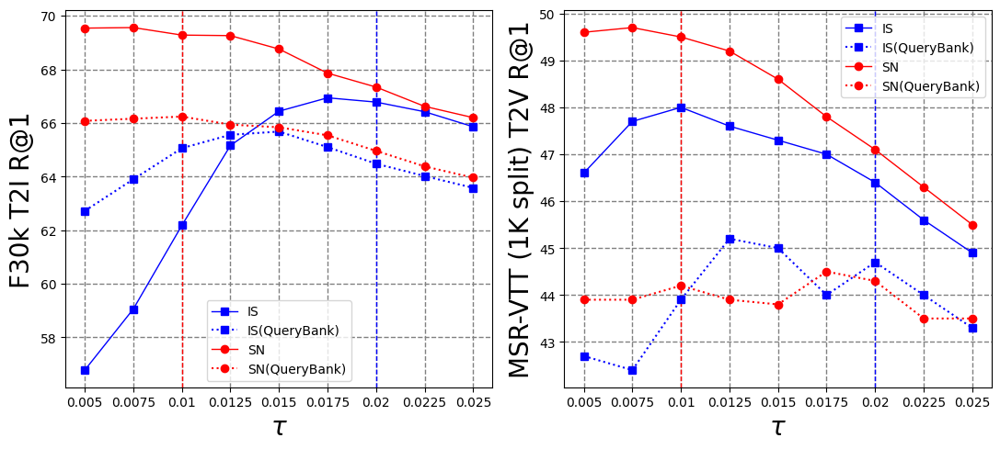

In [9]:
import math
import numpy as np
import matplotlib.pyplot as plt

cood_label = (r"$\tau$","F30k T2I R@1")

taus = [0.005, 0.0075, 0.01, 0.0125, 0.015, 0.0175, 0.02, 0.0225, 0.025,]

is_r1s = [56.78, 59.06, 62.18, 65.16, 66.44, 66.94, 66.78, 66.42, 65.86] 
sn_r1s = [69.54, 69.56, 69.28, 69.26, 68.76, 67.86, 67.34, 66.62, 66.2]
isqb_r1s = [62.72, 63.9, 65.06, 65.56, 65.68, 65.1, 64.48, 64.02, 63.58] 
snqb_r1s = [66.08, 66.16, 66.24, 65.94, 65.84, 65.54, 64.96, 64.38, 63.96]

data = {tau: [is_r1, sn_r1, isqb_r1, snqb_r1] for tau, is_r1, sn_r1, isqb_r1, snqb_r1 in \
        zip(taus, is_r1s, sn_r1s, isqb_r1s, snqb_r1s)}

# fig, ax = plt.subplots(figsize=(5,4))
fig, axs = plt.subplots(1, 2, figsize=(11,5))


# f30k
ax = axs[0]
ax.axvline(x=0.01, linestyle="--" ,color="red", linewidth=1.0)
ax.axvline(x=0.02, linestyle="--" ,color="blue", linewidth=1.0)

_is = [s[0] for s in data.values()]
_sn = [s[1] for s in data.values()]
_is_training = [s[2] for s in data.values()]
_sn_training = [s[3] for s in data.values()]
ax.plot(taus, _is, "-s", color="blue", markerfacecolor='blue',linewidth=1.0, label="IS")
ax.plot(taus, _is_training, ":s", color="blue", markerfacecolor='blue',linewidth=1.5, label="IS(QueryBank)")
ax.plot(taus, _sn, "-o", color="red", markerfacecolor='red',linewidth=1.0, label="SN")
ax.plot(taus, _sn_training, ":o", color="red", markerfacecolor='red',linewidth=1.5, label="SN(QueryBank)")

xticks = ["%.3f"%tau for tau in taus]
xticks[1] = "%.4f"%taus[1]
xticks[2] = "%.2f"%taus[2]
xticks[3] = "%.4f"%taus[3]
xticks[5] = "%.4f"%taus[5]
xticks[6] = "%.2f"%taus[6]
xticks[7] = "%.4f"%taus[7]
ax.set_xticks(taus, xticks)
ax.set_xlabel(cood_label[0], fontsize=20)
ax.set_ylabel(cood_label[1], fontsize=20)
ax.legend(loc='best')
ax.grid(color='gray', linestyle='--', linewidth=1)

# msrvtt
ax = axs[1]
cood_label = (r"$\tau$","MSR-VTT (1K split) T2V R@1")
is_r1s = [46.6, 47.7, 48.0, 47.6, 47.3, 47.0, 46.4, 45.6, 44.9]
sn_r1s = [49.6, 49.7, 49.5, 49.2, 48.6, 47.8, 47.1, 46.3, 45.5]
isqb_r1s = [42.7, 42.4, 43.9, 45.2, 45.0, 44.0, 44.7, 44.0, 43.3]
snqb_r1s = [43.9, 43.9, 44.2, 43.9, 43.8, 44.5, 44.3, 43.5, 43.5]
data = {tau: [is_r1, sn_r1, isqb_r1, snqb_r1] for tau, is_r1, sn_r1, isqb_r1, snqb_r1 in \
        zip(taus, is_r1s, sn_r1s, isqb_r1s, snqb_r1s)}
ax.axvline(x=0.01, linestyle="--" ,color="red", linewidth=1.0)
ax.axvline(x=0.02, linestyle="--" ,color="blue", linewidth=1.0)
_is = [s[0] for s in data.values()]
_sn = [s[1] for s in data.values()]
_is_training = [s[2] for s in data.values()]
_sn_training = [s[3] for s in data.values()]
ax.plot(taus, _is, "-s", color="blue", markerfacecolor='blue',linewidth=1.0, label="IS")
ax.plot(taus, _is_training, ":s", color="blue", markerfacecolor='blue',linewidth=1.5, label="IS(QueryBank)")
ax.plot(taus, _sn, "-o", color="red", markerfacecolor='red',linewidth=1.0, label="SN")
ax.plot(taus, _sn_training, ":o", color="red", markerfacecolor='red',linewidth=1.5, label="SN(QueryBank)")
xticks = ["%.3f"%tau for tau in taus]
xticks[1] = "%.4f"%taus[1]
xticks[2] = "%.2f"%taus[2]
xticks[3] = "%.4f"%taus[3]
xticks[5] = "%.4f"%taus[5]
xticks[6] = "%.2f"%taus[6]
xticks[7] = "%.4f"%taus[7]
ax.set_xticks(taus, xticks)
ax.set_xlabel(cood_label[0], fontsize=20)
ax.set_ylabel(cood_label[1], fontsize=20)
ax.legend(loc='best')
ax.grid(color='gray', linestyle='--', linewidth=1)



plt.tight_layout()
# plt.savefig("./imgs/KNN_coco5k.png")
plt.show()

## querytype

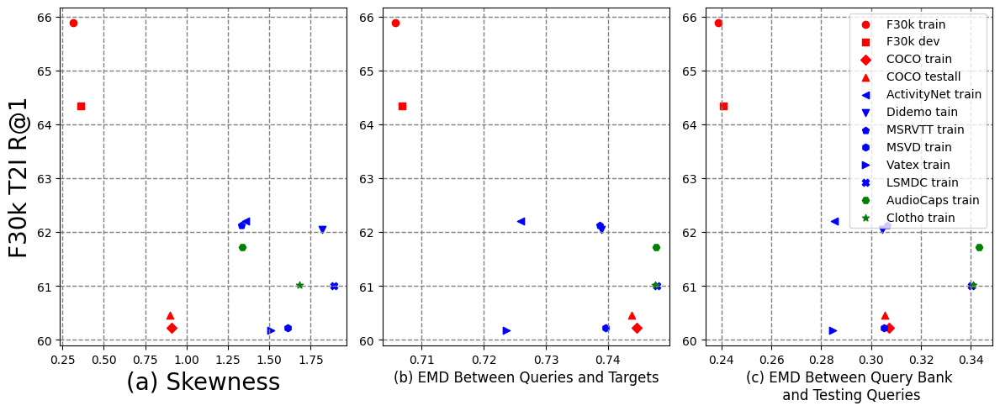

In [14]:
import math
import numpy as np
import matplotlib.pyplot as plt

# 准备数据
data_list = []


### R@1
cap_lens = [5000, 144999, 5070, 566433, 25000, 37376, 32896, 199934, 80768, 289791, 101078, 49152, 19194]
t2i_r1s = [58.84, 65.88, 64.34, 60.22, 60.46, 62.2, 62.04, 62.12, 60.22, 60.18, 61.0, 61.72, 61.02]
skewnesss = [2.6701171843574105, 0.31280845846717314, 0.3597331198591635, 0.908544702205389, 0.8999942257621683,
              1.3560425526011541, 1.8177557645089095, 1.3308491510326423, 1.611930061362774, 1.5068425886270382, 
              1.8897434354417464, 1.336830327572108, 1.6801023034837668]
gq_t_emds = [6.986151959154199e-11, 0.7057921110520757, 0.7068062170222694, 0.7446428788471898, 0.7438495658547101, 
            0.7259770157571956, 0.7388777825206049, 0.7387000644495013, 0.7395929729083057, 0.7235843780349305, 
            0.7478243161127828, 0.7477138722615072, 0.7476454337060988]
gq_q_emds = [0.6826277254875748, 0.23882050784110292, 0.2407519509242232, 0.3071419671952494, 0.3053643366644217, 
            0.28510959300738997, 0.3044325500893581, 0.3065344651656629, 0.3050013557174914, 0.28459097892570895, 
            0.3400788230877099, 0.3434051738899396, 0.3410391464409999]


data_list.append(cap_lens)
data_list.append(t2i_r1s)
data_list.append(skewnesss)
data_list.append(gq_t_emds)
data_list.append(gq_q_emds)

qblists = [
    "F30k test",
    "F30k train",
    "F30k dev",
    "COCO train",
    "COCO testall",
    "ActivityNet train",
    "Didemo tain",
    "MSRVTT train",
    "MSVD train",
    "Vatex train",
    "LSMDC train",
    "AudioCaps train",
    "Clotho train",
]
xlables = ["(a) Skewness","(b) EMD Between Queries and Targets","(c) EMD Between Query Bank\n and Testing Queries"]
y_label = "F30k T2I R@1"

colors = ['red', 'red', 'red', 'red', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'green', 'green']
shapes = ['o', 's', 'D', '^', '<', 'v', 'p', 'h', '>', 'X', 'H', '*']

# 创建子图
fig, axs = plt.subplots(1, 3, figsize=(12,5))

# 绘制每个图表
for i, ax in enumerate(axs.flatten()):
    y = data_list[1][1:]
    x = data_list[i+2][1:]
    for j in range(len(gq_t_emds)-1):
        ax.scatter(x[j], y[j], color=colors[j], 
                    marker=shapes[j], label=qblists[j+1])
    fontsize=20 if i<1 else 12
    ax.set_xlabel(xlables[i], fontsize=fontsize)
    if i < 1:ax.set_ylabel(y_label, fontsize=20) 
    ax.grid("on")
    ax.grid(color='gray', linestyle='--', linewidth=1)

plt.legend()
plt.tight_layout()

plt.show()

## similarity distribution

#### flcikr30k

2025-04-08 19:30:07,809 
/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/zs_f30k_sims.npy
2025-04-08 19:30:07,815 Baseline: 
2025-04-08 19:30:07,817 videos:1000, captions:5000.
2025-04-08 19:30:08,155 Text to image: 58.8, 83.4, 90.1, 97.8, 1.0, 6.0
2025-04-08 19:30:08,517 Image to text: 79.3, 95.0, 98.1, 99.8, 1.0, 2.1
2025-04-08 19:30:08,518 time profile: metrics 0.70193s
2025-04-08 19:30:08,520 Inverted_Softmax
2025-04-08 19:30:08,634 videos:1000, captions:5000.
2025-04-08 19:30:08,942 Text to image: 62.2, 86.1, 91.8, 98.1, 1.0, 5.7
2025-04-08 19:30:09,305 Image to text: 85.3, 96.5, 98.6, 99.8, 1.0, 1.7
2025-04-08 19:30:09,306 time profile: metrics 0.67165s
2025-04-08 19:30:09,396 Sinkhorn_Normalization
2025-04-08 19:30:10,815 videos:1000, captions:5000.
2025-04-08 19:30:11,132 Text to image: 69.3, 90.2, 94.5, 99.0, 1.0, 3.7
2025-04-08 19:30:11,501 Image to text: 87.9, 98.1, 99.4, 100.0, 1.0, 1.4
2025-04-08 19:30:11,502 time profile: metrics 0.68745s
/tmp/ipykernel_1595034/

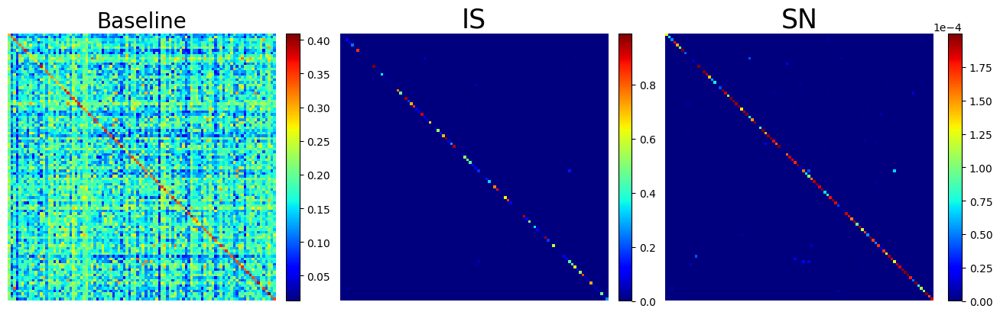

/tmp/ipykernel_1595034/2573838034.py:277: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.01, hspace=0.01)


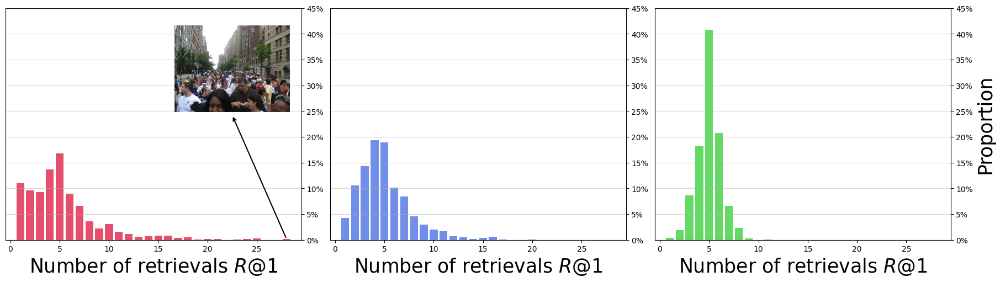

In [1]:
import ot
import time
import logging
import argparse
import numpy as np
from pathlib import Path

import collections
import matplotlib.pyplot as plt
from matplotlib import cm, colors, ticker
from matplotlib.patches import Circle
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

logging.basicConfig(format='%(asctime)s %(message)s', level=logging.INFO)
logger = logging.getLogger(__name__)

def i2t(npts, sims, return_ranks=False, mode="coco"):
    """
    Images->Text (Image Annotation)
    Images: (N, n_region, d) matrix of images
    Captions: (5N, max_n_word, d) matrix of captions
    CapLens: (5N) array of caption lengths
    sims: (N, 5N) matrix of similarity im-cap
    """
    ranks = np.zeros(npts)
    top1 = np.zeros(npts)
    for index in range(npts):
        inds = np.argsort(sims[index])[::-1]
        if mode == 'coco':
            rank = 1e20
            for i in range(5 * index, 5 * index + 5, 1):
                tmp = np.where(inds == i)[0][0]
                if tmp < rank:
                    rank = tmp
            ranks[index] = rank
            top1[index] = inds[0]
        else:
            rank = np.where(inds == index)[0][0]
            ranks[index] = rank
            top1[index] = inds[0]

    # Compute metrics
    r1 = 100.0 * len(np.where(ranks < 1)[0]) / len(ranks)
    r5 = 100.0 * len(np.where(ranks < 5)[0]) / len(ranks)
    r10 = 100.0 * len(np.where(ranks < 10)[0]) / len(ranks)
    r50 = 100.0 * len(np.where(ranks < 50)[0]) / len(ranks)
    mAP10 = 100.0 * np.sum(1 / (ranks[np.where(ranks < 10)[0]] + 1)) / len(ranks)
    medr = np.floor(np.median(ranks)) + 1
    meanr = ranks.mean() + 1

    if return_ranks:
        return r1, r5, r10, r50, medr, meanr, ranks, top1
    else:
        return r1, r5, r10, r50, medr, meanr

def t2i(npts, sims, return_ranks=False, mode="coco"):
    """
    Text->Images (Image Search)
    Images: (N, n_region, d) matrix of images
    Captions: (5N, max_n_word, d) matrix of captions
    CapLens: (5N) array of caption lengths
    sims: (N, 5N) matrix of similarity im-cap
    """
    if mode == 'coco':
        ranks = np.zeros(5 * npts)
        top1 = np.zeros(5 * npts)
    else:
        ranks = np.zeros(npts)
        top1 = np.zeros(npts)

    # --> (5N(caption), N(image))
    sims = sims.T

    for index in range(npts):
        if mode == 'coco':
            for i in range(5):
                inds = np.argsort(sims[5 * index + i])[::-1]
                ranks[5 * index + i] = np.where(inds == index)[0][0]
                top1[5 * index + i] = inds[0]
        else:
            inds = np.argsort(sims[index])[::-1]
            ranks[index] = np.where(inds == index)[0][0]
            top1[index] = inds[0]

    # Compute metrics
    r1 = 100.0 * len(np.where(ranks < 1)[0]) / len(ranks)
    r5 = 100.0 * len(np.where(ranks < 5)[0]) / len(ranks)
    r10 = 100.0 * len(np.where(ranks < 10)[0]) / len(ranks)
    r50 = 100.0 * len(np.where(ranks < 50)[0]) / len(ranks)
    mAP10 = 100.0 * np.sum(1 / (ranks[np.where(ranks < 10)[0]] + 1)) / len(ranks)
    medr = np.floor(np.median(ranks)) + 1
    meanr = ranks.mean() + 1

    if return_ranks:
        return r1, r5, r10, r50, medr, meanr, ranks, top1
    else:
        return r1, r5, r10, r50, medr, meanr

def sims2rank(t2i_sims, i2t_sims=None):
    toc2 = time.time()
    logger.info("videos:{:d}, captions:{:d}.".format(*t2i_sims.shape))
    (r1a, r5a, r10a, r50a, medra, meanra) = t2i(npts=t2i_sims.shape[0], sims=t2i_sims)
    logger.info("Text to image: %.1f, %.1f, %.1f, %.1f, %.1f, %.1f" %
                 (r1a, r5a, r10a, r50a, medra, meanra))
    if i2t_sims is not None:
        (r1, r5, r10, r50, medr, meanr) = i2t(npts=i2t_sims.shape[0], sims=i2t_sims)
        logger.info("Image to text: %.1f, %.1f, %.1f, %.1f, %.1f, %.1f" %
                    (r1, r5, r10, r50, medr, meanr))
    toc3 = time.time()
    logger.info("time profile: metrics {:.5f}s".format(toc3 - toc2))
    return


def Inverted_Softmax(sims, v_tau, t_tau):
    v_hubness = v_tau*np.log(np.exp(sims/v_tau).sum(axis=0,keepdims=True))
    t_hubness = t_tau*np.log(np.exp(sims/t_tau).sum(axis=1,keepdims=True))
    return v_hubness, t_hubness

# def Sinkhorn_Normalization(sims, tau=0.01):
#     r = np.ones(sims.shape[0])/sims.shape[0]
#     c = np.ones(sims.shape[1])/sims.shape[1]
#     P = ot.sinkhorn(r,c,1-sims,reg=tau)
#     return P

def Sinkhorn_Normalization(sims, tau=0.01):
    r = np.ones(sims.shape[0])/sims.shape[0]
    c = np.ones(sims.shape[1])/sims.shape[1]
    P, logs = ot.sinkhorn(r, c, 1-sims, reg=tau, log=True)
    v_hubness = -tau * np.log(logs["v"])
    t_hubness = -tau * np.log(logs["u"])
    return v_hubness, t_hubness

def main():
    class args:
        dataset = "f30k"
        sims_path = "/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/zs_f30k_sims.npy"

    try:
        sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
    except:
        sims = np.load(args.sims_path, allow_pickle=True)
        sims = sims[:,:sims.shape[0]*5]
    
    logger.info("\n%s"%args.sims_path)
    logger.info("Baseline: ")
    sims2rank(sims, sims)
    
    logger.info("Inverted_Softmax")
    v_hubness, t_hubness = Inverted_Softmax(sims, v_tau=0.01, t_tau=0.01)
    sims2rank(sims-t_hubness, sims-v_hubness, )

    logger.info("Sinkhorn_Normalization")
    v_hubness, t_hubness = Sinkhorn_Normalization(sims, tau=0.01)
    sims2rank(sims-t_hubness[:,np.newaxis], sims-v_hubness, )
    logger.info("\n")

def sn_norm(sims, tau=0.01, log=False):
    r = np.ones(sims.shape[0])/sims.shape[0]
    c = np.ones(sims.shape[1])/sims.shape[1]
    if log:
        P, logs = ot.sinkhorn(r,c,1-sims,reg=tau, log=True)
        return logs["u"], logs["v"]
    else:
        P = ot.sinkhorn(r,c,1-sims,reg=tau)
        return P

def is_norm(x, tau=0.01, axis=-1):
    """Compute softmax values for each sets of scores in x."""
    ## 1: na\ive formulation
    return np.exp(x/tau) / np.sum(np.exp(x/tau), axis=axis, keepdims=True)

class args:
    dataset = "f30k"
    sims_path = "/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/zs_f30k_sims.npy"

try:
    sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(args.sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

logger.info("\n%s"%args.sims_path)
logger.info("Baseline: ")
sims2rank(sims, sims)
bl_sims  = sims[:100,:500:5,]

logger.info("Inverted_Softmax")
v_hubness, t_hubness = Inverted_Softmax(sims, v_tau=0.01, t_tau=0.01)
sims2rank(sims-t_hubness, sims-v_hubness, )
# _sims  = sims-v_hubness
is_sims  = is_norm(sims)
_is_sims  = is_sims[:100,:500:5,]

logger.info("Sinkhorn_Normalization")
v_hubness, t_hubness = Sinkhorn_Normalization(sims, tau=0.01)
sims2rank(sims-t_hubness[:,np.newaxis], sims-v_hubness, )
sn_sims  = sn_norm(sims)
_sn_sims  = sn_sims[:100,:500:5,]

cmap = cm.get_cmap("jet")
fig, axs = plt.subplots(1, 3, figsize=[13, 4], constrained_layout=True)
im1 = axs[0].imshow(bl_sims, cmap=cmap)
axs[0].set_title("Baseline", fontsize=20)
im2 = axs[1].imshow(_is_sims, cmap=cmap)
axs[1].set_title("IS", fontsize=25)
im3 = axs[2].imshow(_sn_sims, cmap=cmap)
axs[2].set_title("SN", fontsize=25)

# 移除坐标轴
for ax in axs:
    ax.axis("off")

# 增加一个共享的 colorbar
fig.colorbar(im1, ax=axs[0], fraction=0.05, pad=0.04)
fig.colorbar(im2, ax=axs[1], fraction=0.05, pad=0.04)
cbar = fig.colorbar(im3, ax=axs[2], fraction=0.05, pad=0.001)
cbar.ax.ticklabel_format(style='sci', scilimits=(0,0))  # 将 colorbar 值格式设置为科学计数法

###
plt.subplots_adjust(wspace=0.1)  # 调整子图之间的间距
plt.show()

# 定义直方图绘制函数
def plot_hist(ax, sims, title, color):
    i2t_inds = sims.argmax(axis=-1)
    t2i_inds = sims.argmax(axis=-2)
    t2i_rankings = collections.Counter(t2i_inds.tolist())
    
    # 绘制直方图，设置颜色和标题
    ax.hist(t2i_rankings.values(), bins=range(30), rwidth=0.8, color=color, alpha=0.75)
    ax.set_xlabel("Number of retrievals $R@1$", fontsize=25)
    xticks = [item + 0.5 for item in range(0,30,5)]
    ax.set_xticks(xticks)
    ax.set_xticklabels(["%d"%item for i,item in enumerate(xticks)])
    ax.set_xlim(0, 30)

    yticks = list(range(0, 500, 50))
    ax.set_yticks(yticks)
    ax.set_yticklabels(["%d%%" % (item / 10) for item in yticks])
    # ax.set_title(title, fontsize=25)
    
    ax.yaxis.set_label_position('right')
    ax.yaxis.tick_right()
    ax.grid(axis='y', alpha=0.5)

# 创建图形和三个子图
fig, axs = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
axs[-1].set_ylabel("Proportion", fontsize=25)

# 绘制每个直方图，使用不同的颜色
plot_hist(axs[0], sims, "Baseline", "crimson")        # 鲜红色
plot_hist(axs[1], is_sims, "IS", "royalblue")  # 亮蓝色
plot_hist(axs[2], sn_sims, "SN", "limegreen")  # 亮绿色

# 第一张图添加子图
#### 添加圆圈标记
x_pos = 28  # 横坐标位置（例如28缩放到2.8）
# y_pos = max(ax.get_ylim()) * 0.8  # 纵坐标
y_pos = 2


#### 在右上角插入图片
image_path = "/extra/panzx/dataset/CrossModalRetrieval/f30k/flickr30k-images/2508851882.jpg"
image = plt.imread(image_path)  # 加载图片
offset_image = OffsetImage(image, zoom=0.3)  # 调整图片缩放比例
annotation_box = AnnotationBbox(offset_image, (x_pos-5, y_pos + 330), frameon=False)
axs[0].add_artist(annotation_box)

# ## 
axs[0].annotate('', xy=(x_pos+0.5, y_pos), xytext=(x_pos-5, y_pos + 240),
                arrowprops=dict(facecolor='black', arrowstyle="<-", lw=1.5))
# circle = Circle((x_pos+0.5, y_pos), 2, edgecolor='black', fill=False, lw=2)
# axs[0].add_patch(circle)

# 设置整体标题
# fig.suptitle(r"Flickr30k test set (text$\rightarrow$image)", fontsize=16)
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()

## hub image

path of most popular image is: /extra/panzx/dataset/CrossModalRetrieval/f30k/flickr30k-images/2508851882.jpg
top 1 counts: 39; they are
People standing outside of a building .
Four police officers are swallowed up by the large crowd of people on the street .
A large crowd of people walking while being controlled by officers among them .
A large crowd of people are walking down the street .
A large group of people fill a street .
A large crowd of people are walking .
These people are walking in a crowd of people .
A crowd forms on a busy street to watch a street performer .
A crowd of people walking down the middle of a city street .
A large group of people walking down a city street .
A crowd of people walking in the street of a city .
A crowd is assembled in a street .
A view of a crowded city street .
People are gathered in a park .
A crowd on a busy daytime street .
A crowd is gathered in a large outdoor public space .
A woman in a white shirt and hat speaks to a large crowd of men 

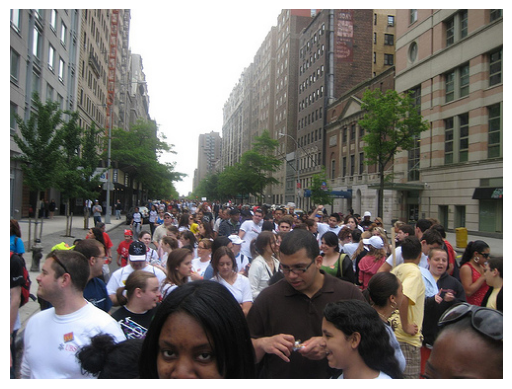

In [5]:
import ot
import time
import json
import logging
import argparse
import numpy as np
from pathlib import Path
from PIL import Image
import collections
import matplotlib.pyplot as plt
from matplotlib import cm, colors, ticker

logging.basicConfig(format='%(asctime)s %(message)s', level=logging.INFO)
logger = logging.getLogger(__name__)

class args:
    dataset = "f30k"
    sims_path = "/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/zs_f30k_sims.npy"

try:
    sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(args.sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

## annotations 
dataset = "f30k"
prefix = "/extra/panzx/dataset/CrossModalRetrieval/f30k/"
anno_prefix = prefix+"precomp/"
anno_path = anno_prefix+"test_caps.txt"
id_path = anno_prefix+"test_ids.txt"
id2filename_path = prefix + "id_mapping.json"
imgs_root = prefix+"flickr30k-images/"

with open(anno_path, mode='r') as file:
    annos = [line.strip() for line in file.readlines()]

with open(id_path, mode='r') as file:
    ids = [line.strip() for i,line in enumerate(file.readlines()) if i%5==0]

with open(id2filename_path, 'r') as file:
    id2name = json.load(file)

imgs_path = []
for id in ids:
    filename = imgs_root+id2name[id]
    imgs_path.append(filename)

## most popular image
t2i_inds = sims.argmax(axis=-2)
unique_ids, counts = np.unique(t2i_inds, return_counts=True)
most_frequent_id = unique_ids[np.argmax(counts)]

image_path = imgs_path[most_frequent_id]
print("path of most popular image is: %s"%image_path)
print("top 1 counts: %d; they are"%np.max(counts))

cpi = 5
for id in np.where(t2i_inds==most_frequent_id)[0]:
    caption = annos[id]
    # print(caption)
    if id//cpi==most_frequent_id:
        ## gt
        print("\033[32m%s\033[0m"%caption)
    else:
        print("\033[31m%s\033[0m"%caption)

plt.figure()
plt.imshow(Image.open(image_path))
plt.axis("off")
plt.show()

#### xpool on clip4clip

2025-04-02 11:31:07,500 
/home/panzx/retrieval/HubnessOT/Video_Text_Retrieval/runs/sims/xpool/msrvtt/xpool_sims.npy
2025-04-02 11:31:07,502 Baseline: 
2025-04-02 11:31:07,503 videos:1000, captions:1000.
2025-04-02 11:31:07,638 time profile: metrics 0.13503s
2025-04-02 11:31:07,639 Text-to-Video: R@1: 48.0 - R@5: 73.1 - R@10: 83.2 - Mean R: 2.0 - Median R: 14.0 
2025-04-02 11:31:07,640 Video-to-Text: R@1: 47.1 - R@5: 75.6 - R@10: 84.6 - Mean R: 2.0 - Median R: 8.8
2025-04-02 11:31:07,644 Inverted_Softmax
2025-04-02 11:31:07,659 videos:1000, captions:1000.
2025-04-02 11:31:07,786 time profile: metrics 0.12689s
2025-04-02 11:31:07,787 Text-to-Video: R@1: 50.8 - R@5: 77.2 - R@10: 86.5 - Mean R: 1.0 - Median R: 10.5 
2025-04-02 11:31:07,788 Video-to-Text: R@1: 51.3 - R@5: 78.5 - R@10: 86.0 - Mean R: 1.0 - Median R: 7.8
2025-04-02 11:31:07,800 Sinkhorn_Normalization
/home/panzx/.conda/envs/clip/lib/python3.8/site-packages/ot/bregman/_sinkhorn.py:531: UserWarning: Sinkhorn did not converge. Y

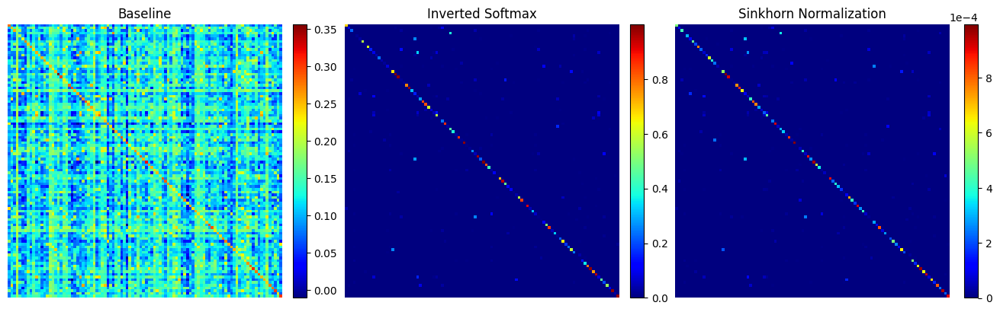

/tmp/ipykernel_3491320/959997240.py:318: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(wspace=0.01, hspace=0.01)


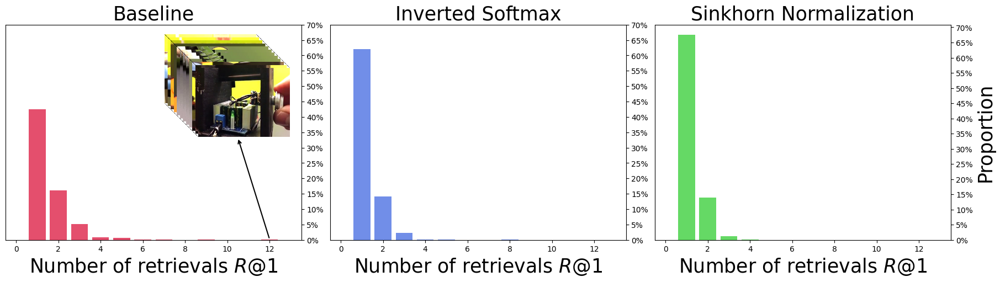

In [3]:
import ot
import time
import logging
import argparse
import numpy as np
from pathlib import Path

import collections
import matplotlib.pyplot as plt
from matplotlib import cm, colors, ticker
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

logging.basicConfig(format='%(asctime)s %(message)s', level=logging.INFO)
logger = logging.getLogger(__name__)

def v2t(sims, return_ranks=False):
    """
    Images->Text (Image Annotation)
    Images: (N, n_region, d) matrix of images
    Captions: (5N, max_n_word, d) matrix of captions
    CapLens: (5N) array of caption lengths
    sims: (N, 5N) matrix of similarity im-cap
    """
    npts = sims.shape[0]
    mode = npts != sims.shape[1]
    tov = 20 ## t/v


    ranks = np.zeros(npts)
    top1 = np.zeros(npts)
    for index in range(npts):
        inds = np.argsort(sims[index])[::-1]
        if mode:
            rank = 1e20
            for i in range(tov * index, tov * index + tov, 1):
                tmp = np.where(inds == i)[0][0]
                if tmp < rank:
                    rank = tmp
            ranks[index] = rank
            top1[index] = inds[0]
        else:
            rank = np.where(inds == index)[0][0]
            ranks[index] = rank
            top1[index] = inds[0]

    # Compute metrics
    r1 = 100.0 * len(np.where(ranks < 1)[0]) / len(ranks)
    r5 = 100.0 * len(np.where(ranks < 5)[0]) / len(ranks)
    r10 = 100.0 * len(np.where(ranks < 10)[0]) / len(ranks)
    r50 = 100.0 * len(np.where(ranks < 50)[0]) / len(ranks)
    mAP10 = 100.0 * np.sum(1 / (ranks[np.where(ranks < 10)[0]] + 1)) / len(ranks)
    medr = np.floor(np.median(ranks)) + 1
    meanr = ranks.mean() + 1

    # if return_ranks:
    #     return r1, r5, r10, r50, medr, meanr, ranks, top1
    # else:
    #     return r1, r5, r10, r50, medr, meanr
    metrics = {}
    metrics['R1'] = r1
    metrics['R5'] = r5
    metrics['R10'] = r10
    metrics['MR'] = meanr
    metrics["MedianR"] = metrics['MR']
    metrics["MeanR"] = medr
    # metrics["cols"] = [int(i) for i in list(ind)]
    return metrics

def t2v(sims, return_ranks=False):
    """
    Text->Images (Image Search)
    Images: (N, n_region, d) matrix of images
    Captions: (5N, max_n_word, d) matrix of captions
    CapLens: (5N) array of caption lengths
    sims: (N, 5N) matrix of similarity im-cap
    """
    npts = sims.shape[0]
    mode = npts != sims.shape[1]
    tov = 20 ## t/v

    if mode:
        ranks = np.zeros(tov * npts)
        top1 = np.zeros(tov * npts)
    else:
        ranks = np.zeros(npts)
        top1 = np.zeros(npts)

    # --> (5N(caption), N(image))
    sims = sims.T

    for index in range(npts):
        if mode:
            for i in range(tov):
                inds = np.argsort(sims[tov * index + i])[::-1]
                ranks[tov * index + i] = np.where(inds == index)[0][0]
                top1[tov * index + i] = inds[0]
        else:
            inds = np.argsort(sims[index])[::-1]
            ranks[index] = np.where(inds == index)[0][0]
            top1[index] = inds[0]

    # Compute metrics
    r1 = 100.0 * len(np.where(ranks < 1)[0]) / len(ranks)
    r5 = 100.0 * len(np.where(ranks < 5)[0]) / len(ranks)
    r10 = 100.0 * len(np.where(ranks < 10)[0]) / len(ranks)
    r50 = 100.0 * len(np.where(ranks < 50)[0]) / len(ranks)
    mAP10 = 100.0 * np.sum(1 / (ranks[np.where(ranks < 10)[0]] + 1)) / len(ranks)
    medr = np.floor(np.median(ranks)) + 1
    meanr = ranks.mean() + 1

    # if return_ranks:
    #     return r1, r5, r10, r50, medr, meanr, ranks, top1
    # else:
    #     return r1, r5, r10, r50, medr, meanr
    metrics = {}
    metrics['R1'] = r1
    metrics['R5'] = r5
    metrics['R10'] = r10
    metrics['MR'] = meanr
    metrics["MedianR"] = metrics['MR']
    metrics["MeanR"] = medr
    # metrics["cols"] = [int(i) for i in list(ind)]
    return metrics

def sims2rank(t2i_sims, i2t_sims=None):
    toc2 = time.time()
    logger.info("videos:{:d}, captions:{:d}.".format(*t2i_sims.shape))
    (r1a, r5a, r10a, r50a, medra, meanra) = t2i(npts=t2i_sims.shape[0], sims=t2i_sims)
    logger.info("Text to image: %.1f, %.1f, %.1f, %.1f, %.1f, %.1f" %
                 (r1a, r5a, r10a, r50a, medra, meanra))
    if i2t_sims is not None:
        (r1, r5, r10, r50, medr, meanr) = i2t(npts=i2t_sims.shape[0], sims=i2t_sims)
        logger.info("Image to text: %.1f, %.1f, %.1f, %.1f, %.1f, %.1f" %
                    (r1, r5, r10, r50, medr, meanr))
    toc3 = time.time()
    logger.info("time profile: metrics {:.5f}s".format(toc3 - toc2))
    return

def sims2rank(t2v_sims, v2t_sims):
    toc2 = time.time()
    logger.info("videos:{:d}, captions:{:d}.".format(*t2v_sims.shape))
    tv_metrics = t2v(sims=t2v_sims)
    vt_metrics = v2t(sims=v2t_sims)

    toc3 = time.time()
    logger.info("time profile: metrics {:.5f}s".format(toc3 - toc2))
    logger.info("Text-to-Video: R@1: {:.1f} - R@5: {:.1f} - R@10: {:.1f} - Mean R: {:.1f} - Median R: {:.1f} ".
                format(tv_metrics['R1'], tv_metrics['R5'], tv_metrics['R10'], tv_metrics['MeanR'], tv_metrics['MR']))
    logger.info("Video-to-Text: R@1: {:.1f} - R@5: {:.1f} - R@10: {:.1f} - Mean R: {:.1f} - Median R: {:.1f}".format(
        vt_metrics['R1'], vt_metrics['R5'], vt_metrics['R10'], vt_metrics['MeanR'], vt_metrics['MR']))
    return

def Inverted_Softmax(sims, v_tau, t_tau):
    t_hubness = v_tau*np.log(np.exp(sims/v_tau).sum(axis=0,keepdims=True))
    v_hubness = t_tau*np.log(np.exp(sims/t_tau).sum(axis=1,keepdims=True))
    return t_hubness,v_hubness

# def Sinkhorn_Normalization(sims, tau=0.01):
#     r = np.ones(sims.shape[0])/sims.shape[0]
#     c = np.ones(sims.shape[1])/sims.shape[1]
#     P = ot.sinkhorn(r,c,1-sims,reg=tau)
#     return P

def Sinkhorn_Normalization(sims, tau=0.01):
    r = np.ones(sims.shape[0])/sims.shape[0]
    c = np.ones(sims.shape[1])/sims.shape[1]
    P, logs = ot.sinkhorn(r, c, 1-sims, reg=tau, log=True, numItermax=5)
    t_hubness = -tau * np.log(logs["v"])
    v_hubness = -tau * np.log(logs["u"])
    return v_hubness, t_hubness

def main():
    class args:
        dataset = "f30k"
        sims_path = "/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/zs_f30k_sims.npy"

    try:
        sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
    except:
        sims = np.load(args.sims_path, allow_pickle=True)
        sims = sims[:,:sims.shape[0]*5]
    
    logger.info("\n%s"%args.sims_path)
    logger.info("Baseline: ")
    sims2rank(sims, sims)
    
    logger.info("Inverted_Softmax")
    v_hubness, t_hubness = Inverted_Softmax(sims, v_tau=0.01, t_tau=0.01)
    sims2rank(sims-t_hubness, sims-v_hubness, )

    logger.info("Sinkhorn_Normalization")
    v_hubness, t_hubness = Sinkhorn_Normalization(sims, tau=0.01)
    sims2rank(sims-t_hubness[:,np.newaxis], sims-v_hubness, )
    logger.info("\n")

def sn_norm(sims, tau=0.01, log=False):
    r = np.ones(sims.shape[0])/sims.shape[0]
    c = np.ones(sims.shape[1])/sims.shape[1]
    if log:
        P, logs = ot.sinkhorn(r,c,1-sims,reg=tau, log=True)
        return logs["u"], logs["v"]
    else:
        P = ot.sinkhorn(r,c,1-sims,reg=tau)
        return P

def is_norm(x, tau=0.01, axis=-1):
    """Compute softmax values for each sets of scores in x."""
    ## 1: na\ive formulation
    return np.exp(x/tau) / np.sum(np.exp(x/tau), axis=axis, keepdims=True)

class args:
    sims_path = "/home/panzx/retrieval/HubnessOT/Video_Text_Retrieval/runs/sims/xpool/msrvtt/xpool_sims.npy"

try:
    sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(args.sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

beg = 800
sims = sims.T 
logger.info("\n%s"%args.sims_path)
logger.info("Baseline: ")
sims2rank(sims, sims)
bl_sims  = sims[beg:beg+100,beg:beg+100,]

## others : t_tau = 0.02 for best
logger.info("Inverted_Softmax")
t_hubness, v_hubness = Inverted_Softmax(sims, t_tau=0.01, v_tau=0.01)
sims2rank(sims-v_hubness, sims-t_hubness)
is_sims  = is_norm(sims)
_is_sims  = is_sims[beg:beg+100,beg:beg+100,]

logger.info("Sinkhorn_Normalization")
v_hubness, t_hubness = Sinkhorn_Normalization(sims, tau=0.01)
sims2rank(sims-v_hubness[:,np.newaxis], sims-t_hubness)
sn_sims  = sn_norm(sims)
_sn_sims  = sn_sims[beg:beg+100,beg:beg+100,]

cmap = cm.get_cmap("jet")
fig, axs = plt.subplots(1, 3, figsize=[13, 4], constrained_layout=True)
im1 = axs[0].imshow(bl_sims, cmap=cmap)
axs[0].set_title("Baseline")
im2 = axs[1].imshow(_is_sims, cmap=cmap)
axs[1].set_title("Inverted Softmax")
im3 = axs[2].imshow(_sn_sims, cmap=cmap)
axs[2].set_title("Sinkhorn Normalization")

# 移除坐标轴
for ax in axs:
    ax.axis("off")

# 增加一个共享的 colorbar
fig.colorbar(im1, ax=axs[0], fraction=0.05, pad=0.04)
fig.colorbar(im2, ax=axs[1], fraction=0.05, pad=0.04)
cbar = fig.colorbar(im3, ax=axs[2], fraction=0.05, pad=0.001)
cbar.ax.ticklabel_format(style='sci', scilimits=(0,0))  # 将 colorbar 值格式设置为科学计数法

###
plt.subplots_adjust(wspace=0.1)  # 调整子图之间的间距
plt.show()

# 定义直方图绘制函数
def plot_hist(ax, sims, title, color):
    i2t_inds = sims.argmax(axis=-1)
    t2i_inds = sims.argmax(axis=-2)
    t2i_rankings = collections.Counter(t2i_inds.tolist())
    
    # 绘制直方图，设置颜色和标题
    max_x = 14
    if color == "crimson":  
        ax.hist([12]+list(t2i_rankings.values()), bins=range(max_x), rwidth=0.8, color=color, alpha=0.75)
    else:
        ax.hist(t2i_rankings.values(), bins=range(max_x), rwidth=0.8, color=color, alpha=0.75)
    ax.set_xlabel("Number of retrievals $R@1$", fontsize=25)
    xticks = [item + 0.5 for item in range(0,max_x,2)]
    ax.set_xticks(xticks)
    ax.set_xticklabels(["%d"%item for i,item in enumerate(xticks)])
    ax.set_xlim(0, max_x)

    yticks = list(range(0, 701, 50))
    ax.set_yticks(yticks)
    ax.set_yticklabels(["%d%%" % (item / 10) for item in yticks])
    ax.set_title(title, fontsize=25)

    ax.yaxis.set_label_position('right')
    ax.yaxis.tick_right()

# 创建图形和三个子图
fig, axs = plt.subplots(1, 3, figsize=(18, 5), constrained_layout=True)
axs[-1].set_ylabel("Proportion", fontsize=25)

# 绘制每个直方图，使用不同的颜色
plot_hist(axs[0], sims, "Baseline", "crimson")        # 鲜红色
plot_hist(axs[1], is_sims, "Inverted Softmax", "royalblue")  # 亮蓝色
plot_hist(axs[2], sn_sims, "Sinkhorn Normalization", "limegreen")  # 亮绿色

# 第一张图添加子图
#### 添加圆圈标记
x_pos = 12
y_pos = 2

#### 在右上角插入图片
image_path = "/home/panzx/retrieval/HubnessOT/Visualization/popular_video.png"
image = plt.imread(image_path)  # 加载图片
offset_image = OffsetImage(image, zoom=0.4)  # 调整图片缩放比例
annotation_box = AnnotationBbox(offset_image, (x_pos-1.5, y_pos + 500), frameon=False)
axs[0].add_artist(annotation_box)

# ## 
axs[0].annotate('', xy=(x_pos+0.5, y_pos), xytext=(x_pos-1, y_pos + 330),
                arrowprops=dict(facecolor='black', arrowstyle="<-", lw=1.5))
# circle = Circle((x_pos+0.5, y_pos), 2, edgecolor='black', fill=False, lw=2)
# axs[0].add_patch(circle)

# 设置整体标题
# fig.suptitle(r"Flickr30k test set (text$\rightarrow$image)", fontsize=16)
plt.subplots_adjust(wspace=0.01, hspace=0.01)
plt.show()


## hub video

path of most popular video is: /home/panzx/dataset/VideoDatasets/MSR_VTT/Compressed_Videos/video8121.mp4
top 1 counts: 12; they are
a student explains to his teacher about the sheep of another student
there is a man shooting other people in a corridor
a man is giving his commentary on a current event television show
there was a resistor in the back
advertisement of seat basket
a video game is played
a scene from spongebob squarepants where the townspeople are carrying torches and chasing a giant squidward
a woman applies makeip to her eyes in double speed
a girl singing a song and her group were playing music
two guys are wrestling in a competition
news of marijuana business having trouble growing
two people playing basketball and the one with a hat makes every shot


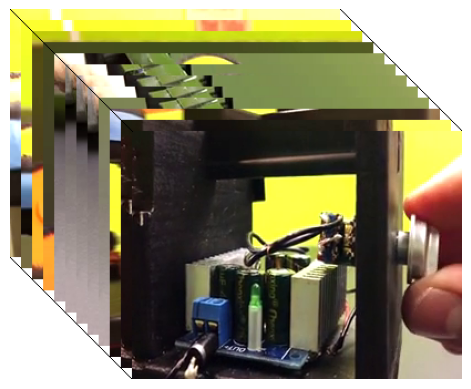

In [20]:
import os
import ot
import cv2
import csv
import json
import numpy as np
import torch
import random
from PIL import Image
import matplotlib.pyplot as plt

from os.path import exists
from decord import VideoReader, cpu
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, \
                                    Normalize, InterpolationMode

import sys
sys.path.insert(0,"/home/panzx/retrieval/LoraDRL")
import tvr.dataloaders.video_transforms as video_transforms

class Args:
    def __init__(self):
        self.max_frames = 12
        self.image_resolution = 224
        self.video_framerate = 1
        self.subset = "test"
        
        # 创建数据增强变换（假设你有 video_transforms 模块和 create_random_augment 函数）
        self.aug_transform = video_transforms.create_random_augment(
            input_size=(self.image_resolution, self.image_resolution),
            auto_augment='rand-m7-n4-mstd0.5-inc1',
            interpolation='bicubic',
        )

        # 定义图像处理的变换管道
        self.transform = Compose([
            Resize(self.image_resolution, interpolation=InterpolationMode.BICUBIC),
            CenterCrop(self.image_resolution),
            lambda image: image.convert("RGB"),  # 确保图像为RGB格式
            ToTensor(),  # 将图像转为张量
            Normalize((0.48145466, 0.4578275, 0.40821073),  # 正常化
                    (0.26862954, 0.26130258, 0.27577711)),
        ])

def _get_rawvideo_dec(args, video_path, s=None, e=None):
    # speed up video decode via decord.
    video_mask = np.zeros(args.max_frames, dtype="long")
    max_video_length = 0

    # T x 3 x H x W
    video = np.zeros((args.max_frames, 3, args.image_resolution, args.image_resolution), dtype="float")

    if s is None:
        start_time, end_time = None, None
    else:
        start_time = int(s)
        end_time = int(e)
        start_time = start_time if start_time >= 0. else 0.
        end_time = end_time if end_time >= 0. else 0.
        if start_time > end_time:
            start_time, end_time = end_time, start_time
        elif start_time == end_time:
            end_time = start_time + 1

    if exists(video_path):
        vreader = VideoReader(video_path, ctx=cpu(0))
    else:
        print(video_path)
        raise FileNotFoundError

    fps = vreader.get_avg_fps()
    f_start = 0 if start_time is None else int(start_time * fps)
    f_end = int(min(1000000000 if end_time is None else end_time * fps, len(vreader) - 1))
    num_frames = f_end - f_start + 1
    if num_frames > 0:
        # T x 3 x H x W
        sample_fps = int(args.video_framerate)
        t_stride = int(round(float(fps) / sample_fps))

        all_pos = list(range(f_start, f_end + 1, t_stride))
        if len(all_pos) > args.max_frames:
            sample_pos = [all_pos[_] for _ in np.linspace(0, len(all_pos) - 1, num=args.max_frames, dtype=int)]
        else:
            sample_pos = all_pos

        patch_images = [Image.fromarray(f) for f in vreader.get_batch(sample_pos).asnumpy()]
        raw_images = patch_images[:]
        if args.subset == "train":
            patch_images = args.aug_transform(patch_images)

        patch_images = torch.stack([args.transform(img) for img in patch_images])
        slice_len = patch_images.shape[0]
        max_video_length = max_video_length if max_video_length > slice_len else slice_len
        if slice_len < 1:
            pass
        else:
            video[:slice_len, ...] = patch_images
    else:
        print("video path: {} error.".format(video_path))

    video_mask[:max_video_length] = [1] * max_video_length

    return video, video_mask, raw_images

def path2frame(video_path):
    args = Args()
    _, _, raw_images = _get_rawvideo_dec(args, video_path, )
    frames = [np.array(image) for image in raw_images]
    return frames

def video2image(frames):
    # 配置叠加效果的参数
    num_frames = len(frames)
    offset_x, offset_y = 10, 10  # 每一帧的偏移量

    # 计算最终图像大小（假设偏移不会超出帧大小太多）
    height, width = frames[0].shape[:2]
    canvas = np.zeros((height + offset_y * (num_frames - 1), 
        width + offset_x * (num_frames - 1), 3), dtype=np.uint8)+255

    # 用于存储各帧的四个顶点
    corners = []

    # 叠加每一帧并记录顶点坐标
    for i in range(num_frames):
        # 计算帧在画布中的位置
        x_offset = i * offset_x
        y_offset = i * offset_y
        
        # 将帧叠加到画布上
        canvas[y_offset:y_offset + height, x_offset:x_offset + width] = frames[i]
        
        # 记录当前帧的四个顶点
        top_left = (x_offset, y_offset)
        top_right = (x_offset + width, y_offset)
        bottom_left = (x_offset, y_offset + height)

        # bottom_right = (x_offset + width, y_offset + height)
        # corners.append([top_left, top_right, bottom_left, bottom_right])
        corners.append([top_left, top_right, bottom_left])

    # 画出每个顶点的轨迹
    for i in range(3):  # 每个帧有四个顶点
        for j in range(num_frames - 1):
            # 绘制每个顶点的轨迹
            start_point = corners[j][i]
            end_point = corners[j + 1][i]
            cv2.line(canvas, start_point, end_point, (0, 0, 0), 1)  # 黑色线条，线宽为1

    return canvas

## similarity
class args:
    sims_path = "/home/panzx/retrieval/HubnessOT/Video_Text_Retrieval/runs/sims/xpool/msrvtt/xpool_sims.npy"

try:
    sims = np.load(args.sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(args.sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

## annotations 
dataset = "msrvtt"
prefix = "/home/panzx/dataset/VideoDatasets/MSR_VTT/"
anno_prefix = prefix+"msrvtt_data/"
anno_path = anno_prefix+"MSRVTT_JSFUSION_test.csv"
vids_root = prefix+"Compressed_Videos/"

with open(anno_path, mode='r', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    anno_lines = [line for line in csv_reader]

annos = []
vids_path = []
for line in anno_lines:
    _, _, vid, cap = line
    annos.append(cap)
    filename = vids_root + "%s.mp4"%vid
    vids_path.append(filename)

## most popular image
t2i_inds = sims.argmax(axis=-2)
unique_ids, counts = np.unique(t2i_inds, return_counts=True)
most_frequent_id = unique_ids[np.argmax(counts)]

video_path = vids_path[most_frequent_id]
print("path of most popular video is: %s"%video_path)
print("top 1 counts: %d; they are"%np.max(counts))

cpi = 1
for id in np.where(t2i_inds==most_frequent_id)[0]:
    caption = annos[id]
    # print(caption)
    if id//cpi==most_frequent_id:
        ## gt
        print("\033[32m%s\033[0m"%caption)
    else:
        print("\033[31m%s\033[0m"%caption)

plt.figure()
image = video2image(path2frame(video_path))
plt.imshow(image)
Image.fromarray(image).save("/home/panzx/retrieval/HubnessOT/Visualization/output_image.png")
plt.axis("off")
plt.show()

## image retrieval comparison

- model: zero-shot CLIP VIT-B/32

- dataset: Flickr30k test set

for detailed results, refer to [file](/home/panzx/retrieval/HubnessOT/Visualization/i2t_retrieval_comparison.ipynb)

/home/panzx/.conda/envs/retrieval/lib/python3.8/site-packages/ot/bregman/_sinkhorn.py:498: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/home/panzx/.conda/envs/retrieval/lib/python3.8/site-packages/ot/bregman/_sinkhorn.py:506: UserWarning: Warning: numerical errors at iteration 391
  warnings.warn('Warning: numerical errors at iteration %d' % ii)


A black and white dog is running through the grass .


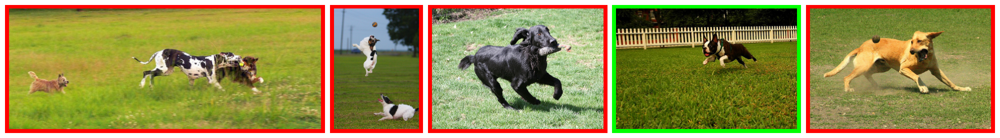

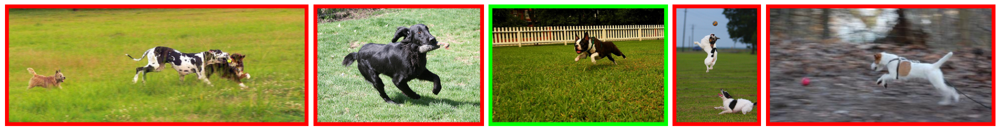

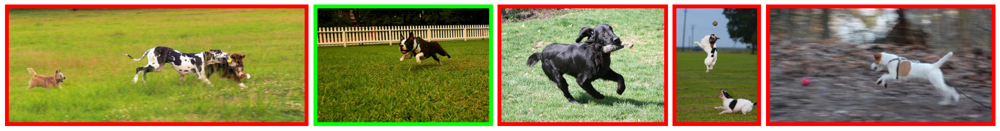

In [1]:
import os
import ot
import cv2
import csv
import json
import numpy as np
import torch
import random
from PIL import Image
import matplotlib.pyplot as plt

def compare(result_x, result_y, topk=1):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20220911 by panzx 
    """
    # x = np.load(result_x_path,allow_pickle=True)
    if isinstance(result_x,str):
        x = torch.load(result_x)
    else:
        x = torch.tensor(result_x)
    # x = torch.from_numpy(x.item()["sims"])
    m,n = x.shape
    # x = x.unsqueeze(dim=1).repeat(1,5,1).reshape(5*m,n)

    # y = np.load(result_y_path,allow_pickle=True)
    if isinstance(result_y,str):
        y = torch.load(result_y)
    else:
        y = torch.tensor(result_y)
    # y = torch.from_numpy(y.item()["sims"])
    if m!=y.shape[0] or n!=y.shape[1]:
        raise ValueError("mismatched shape between x and y")
    # y = y.unsqueeze(dim=1).repeat(1,5,1).reshape(5*m,n)

    t2i = dict()
    t2i["x1y0"] = list()
    t2i["x0y1"] = list()
    i2t = dict()
    i2t["x1y0"] = list()
    i2t["x0y1"] = list()

    # i2t
    _,i2t_ids = x.topk(k=topk,dim=1,largest=True)
    i2t_ids = i2t_ids.unsqueeze(dim=-1).repeat(1,1,topk)
    gt = torch.arange(m*topk).reshape(m,topk).unsqueeze(dim=1).repeat(1,topk,1)
    x_is_in = (i2t_ids==gt).sum(dim=[-2,-1])>0

    _,i2t_ids = y.topk(k=topk,dim=1,largest=True)
    i2t_ids = i2t_ids.unsqueeze(dim=-1).repeat(1,1,topk)
    y_is_in = (i2t_ids==gt).sum(dim=[-2,-1])>0

    i2t["x1y0"] = (x_is_in>y_is_in).nonzero().squeeze().numpy().tolist()
    i2t["x0y1"] = (x_is_in<y_is_in).nonzero().squeeze().numpy().tolist()
    
    # t2i
    _,t2i_ids = x.topk(k=topk,dim=0,largest=True)
    gt = torch.arange(m).unsqueeze(dim=1).repeat(1,topk).reshape(1,n).repeat(topk,1)
    x_is_in = (t2i_ids==gt).sum(dim=[0])>0

    _,t2i_ids = y.topk(k=topk,dim=0,largest=True)
    y_is_in = (t2i_ids==gt).sum(dim=[0])>0

    t2i["x1y0"] = (x_is_in>y_is_in).nonzero().squeeze().numpy().tolist()
    t2i["x0y1"] = (x_is_in<y_is_in).nonzero().squeeze().numpy().tolist()

    return {"i2t":i2t,"t2i":t2i}

def compareV2(result_x, result_y, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    
    _all = np.logical_and(_gt_ind_x > _gt_ind_y, _gt_ind_y < topk)
    indices = np.where(_all==1)

    return indices[0]

def compare_triplet(result_x, result_y, result_z, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y
    _ranking_z = np.argsort(np.argsort(result_z, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_z

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    _gt_ind_z = _ranking_z[gt == 1]
    
    _all = (_gt_ind_x > _gt_ind_y)*(_gt_ind_y > _gt_ind_z)*(_gt_ind_z < topk)
    indices = np.where(_all==1)

    return indices[0]

def plot(raw_imgs, labels, w_step=0.005, h_step=0.01, fix_width=True, show=False):
    ratios = list()
    imgs = list()
    img_size = 240
    plot_size = 256
    pad = (plot_size-img_size)//2
    ws=list()
    for i,img in enumerate(raw_imgs):
        h,w,_ = img.shape
        img = cv2.resize(img,(int(img_size*w/h),img_size))

        # color = [0,255,0] if labels[i] else [255,0,0]
        # border_img = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=color)

        h_new,w_new,_ = img.shape
        border_img = np.zeros((h_new+pad*2, w_new+pad*2, 3), dtype=np.uint8)
        border_img[:] = [0,255,0] if labels[i] else [255,0,0]
        border_img[pad:pad+h_new, pad:pad+w_new, :] = img[:,:,:3]
        
        ## debug
        # print(labels[i])
        # plt.figure()
        # plt.imshow(border_img)
        
        imgs.append(border_img)
        h,w,_ = border_img.shape
        ws.append(w)
    rects = list()
    l = 0
    r = (1-w_step*(len(raw_imgs)+1))
    high = 1-h_step*2
    for w in ws:
        wide = r*w/sum(ws)
        rects.append([l+w_step,h_step,wide,high])
        l = l+w_step+wide
    if fix_width:
        f_w = 20
        f_h = f_w*r*plot_size/(sum(ws)*high)
    else:
        f_h = 4
        f_w = f_h*sum(ws)*high/(r*plot_size)
    # plt.figure(figsize=(f_w,f_h))
    fig = plt.figure(figsize=(f_w,f_h,))
    for i,rect in enumerate(rects):
        ax = plt.axes(rect)
        ax = plt.imshow(imgs[i])
        plt.axis("off")
    if show:plt.show()
    return fig

def otnorm(sims, tau=0.01):
    r = np.ones(sims.shape[0])
    c = np.ones(sims.shape[1])
    P = ot.sinkhorn(r,c,1-sims,reg=tau)
    return P

def isnorm(x, tau, axis):
    """Compute softmax values for each sets of scores in x."""
    ## 1: na\ive formulation
    return np.exp(x/tau) / np.sum(np.exp(x/tau), axis=axis, keepdims=True)

## annotations 
dataset = "f30k"
prefix = "/extra/panzx/dataset/CrossModalRetrieval/f30k/"
anno_prefix = prefix+"precomp/"
anno_path = anno_prefix+"test_caps.txt"
id_path = anno_prefix+"test_ids.txt"
id2filename_path = prefix + "id_mapping.json"
imgs_root = prefix+"flickr30k-images/"

with open(anno_path, mode='r') as file:
    annos = [line.strip() for line in file.readlines()]

with open(id_path, mode='r') as file:
    ids = [line.strip() for i,line in enumerate(file.readlines()) if i%5==0]

with open(id2filename_path, 'r') as file:
    id2name = json.load(file)

imgs_path = []
for id in ids:
    filename = imgs_root+id2name[id]
    imgs_path.append(filename)

## similarities
prefix = "/home/panzx/retrieval/HubnessOT/Image_Retrieval/runs/sims/"
sims_path =  prefix+"zs_%s_sims.npy"%dataset
try:
    sims = np.load(sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

## ground truth
cpi = 5 # captions per image
m,n = sims.shape
_range = torch.arange(n).unsqueeze(dim=1).repeat(1,m)
_lower = (torch.arange(m))*cpi
_upper = (torch.arange(m)+1)*cpi
_gt = (_lower<=_range) * (_range<_upper)
gt = _gt.t().type(torch.float)

_is_sims = isnorm(sims, tau=1, axis=1)
_sn_sims = otnorm(sims) 

# t2i = compareV2(_is_sims, _sn_sims, gt)
t2i = compare_triplet(sims, _is_sims, _sn_sims, gt)

## t2i 
topk=5
for t,id in enumerate(t2i):
    _,t2i_ids_bl = torch.tensor(sims)[:,id].topk(k=topk, dim=0, largest=True) # baseline
    _,t2i_ids_is = torch.tensor(_is_sims)[:,id].topk(k=topk, dim=0, largest=True) # invetted softmax
    _,t2i_ids_sn = torch.tensor(_sn_sims)[:,id].topk(k=topk, dim=0, largest=True) # sinkhorn normalization

    caption = annos[id]
    print(caption)
    ims_bl = [np.array(Image.open(imgs_path[i])) for i in t2i_ids_bl]
    ims_is = [np.array(Image.open(imgs_path[i])) for i in t2i_ids_is]
    ims_sn = [np.array(Image.open(imgs_path[i])) for i in t2i_ids_sn]
    fig_bl = plot(ims_bl, [i==id//5 for i in t2i_ids_bl], show=True)
    fig_bl = plot(ims_is, [i==id//5 for i in t2i_ids_is], show=True)
    fig_sc = plot(ims_sn, [i==id//5 for i in t2i_ids_sn], show=True)
    if t>=0:break

## video retrieval comparison

- model: fine-tune XPool (CLIP VIT-B/32)

- dataset: MSRVTT 1K test set (JSfusion)

for detailed results, refer to [file](/home/panzx/retrieval/HubnessOT/Visualization/v2t_retrieval_comparison.ipynb)

a news reporter talks about a shooting


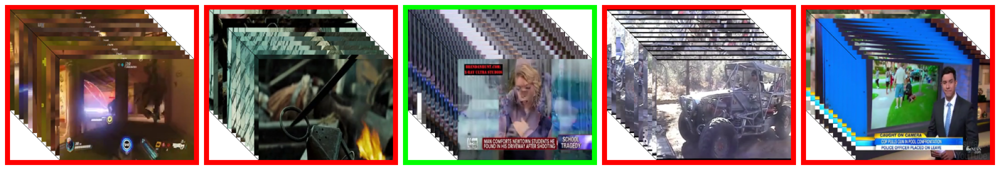

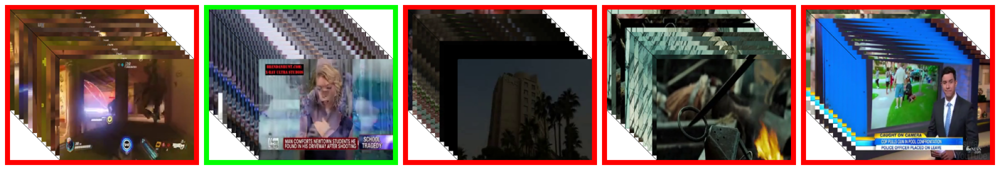

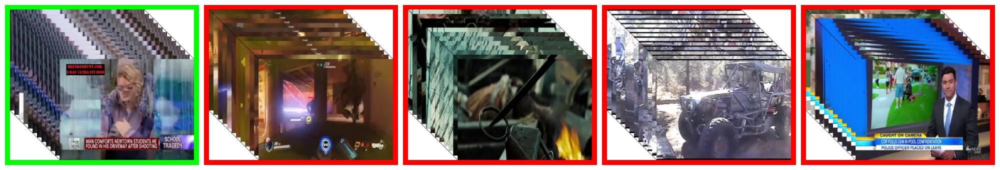

In [7]:
import os
import ot
import cv2
import csv
import json
import numpy as np
import torch
import random
from PIL import Image
import matplotlib.pyplot as plt

from os.path import exists
from decord import VideoReader, cpu
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, \
                                    Normalize, InterpolationMode

import sys
sys.path.insert(0,"/home/panzx/retrieval/LoraDRL")
import tvr.dataloaders.video_transforms as video_transforms

def compareV2(result_x, result_y, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    
    _all = np.logical_and(_gt_ind_x > _gt_ind_y, _gt_ind_y < topk)
    indices = np.where(_all==1)

    return indices[0]

def compare_triplet(result_x, result_y, result_z, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y
    _ranking_z = np.argsort(np.argsort(result_z, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_z

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    _gt_ind_z = _ranking_z[gt == 1]
    
    _all = (_gt_ind_x > _gt_ind_y)*(_gt_ind_y > _gt_ind_z)*(_gt_ind_z < topk)
    indices = np.where(_all==1)

    return indices[0]

class Args:
    def __init__(self):
        self.max_frames = 12
        self.image_resolution = 224
        self.video_framerate = 1
        self.subset = "test"
        
        # 创建数据增强变换（假设你有 video_transforms 模块和 create_random_augment 函数）
        self.aug_transform = video_transforms.create_random_augment(
            input_size=(self.image_resolution, self.image_resolution),
            auto_augment='rand-m7-n4-mstd0.5-inc1',
            interpolation='bicubic',
        )

        # 定义图像处理的变换管道
        self.transform = Compose([
            Resize(self.image_resolution, interpolation=InterpolationMode.BICUBIC),
            CenterCrop(self.image_resolution),
            lambda image: image.convert("RGB"),  # 确保图像为RGB格式
            ToTensor(),  # 将图像转为张量
            Normalize((0.48145466, 0.4578275, 0.40821073),  # 正常化
                    (0.26862954, 0.26130258, 0.27577711)),
        ])

def _get_rawvideo_dec(args, video_path, s=None, e=None):
    # speed up video decode via decord.
    video_mask = np.zeros(args.max_frames, dtype="long")
    max_video_length = 0

    # T x 3 x H x W
    video = np.zeros((args.max_frames, 3, args.image_resolution, args.image_resolution), dtype="float")

    if s is None:
        start_time, end_time = None, None
    else:
        start_time = int(s)
        end_time = int(e)
        start_time = start_time if start_time >= 0. else 0.
        end_time = end_time if end_time >= 0. else 0.
        if start_time > end_time:
            start_time, end_time = end_time, start_time
        elif start_time == end_time:
            end_time = start_time + 1

    if exists(video_path):
        vreader = VideoReader(video_path, ctx=cpu(0))
    else:
        print(video_path)
        raise FileNotFoundError

    fps = vreader.get_avg_fps()
    f_start = 0 if start_time is None else int(start_time * fps)
    f_end = int(min(1000000000 if end_time is None else end_time * fps, len(vreader) - 1))
    num_frames = f_end - f_start + 1
    if num_frames > 0:
        # T x 3 x H x W
        sample_fps = int(args.video_framerate)
        t_stride = int(round(float(fps) / sample_fps))

        all_pos = list(range(f_start, f_end + 1, t_stride))
        if len(all_pos) > args.max_frames:
            sample_pos = [all_pos[_] for _ in np.linspace(0, len(all_pos) - 1, num=args.max_frames, dtype=int)]
        else:
            sample_pos = all_pos

        patch_images = [Image.fromarray(f) for f in vreader.get_batch(sample_pos).asnumpy()]
        raw_images = patch_images[:]
        if args.subset == "train":
            patch_images = args.aug_transform(patch_images)

        patch_images = torch.stack([args.transform(img) for img in patch_images])
        slice_len = patch_images.shape[0]
        max_video_length = max_video_length if max_video_length > slice_len else slice_len
        if slice_len < 1:
            pass
        else:
            video[:slice_len, ...] = patch_images
    else:
        print("video path: {} error.".format(video_path))

    video_mask[:max_video_length] = [1] * max_video_length

    return video, video_mask, raw_images

def path2frame(video_path):
    args = Args()
    _, _, raw_images = _get_rawvideo_dec(args, video_path, )
    frames = [np.array(image) for image in raw_images]
    return frames

def video2image(frames):
    # 配置叠加效果的参数
    num_frames = len(frames)
    offset_x, offset_y = 10, 10  # 每一帧的偏移量

    # 计算最终图像大小（假设偏移不会超出帧大小太多）
    height, width = frames[0].shape[:2]
    canvas = np.zeros((height + offset_y * (num_frames - 1), 
        width + offset_x * (num_frames - 1), 3), dtype=np.uint8)+255

    # 用于存储各帧的四个顶点
    corners = []

    # 叠加每一帧并记录顶点坐标
    for i in range(num_frames):
        # 计算帧在画布中的位置
        x_offset = i * offset_x
        y_offset = i * offset_y
        
        # 将帧叠加到画布上
        canvas[y_offset:y_offset + height, x_offset:x_offset + width] = frames[i]
        
        # 记录当前帧的四个顶点
        top_left = (x_offset, y_offset)
        top_right = (x_offset + width, y_offset)
        bottom_left = (x_offset, y_offset + height)

        # bottom_right = (x_offset + width, y_offset + height)
        # corners.append([top_left, top_right, bottom_left, bottom_right])
        corners.append([top_left, top_right, bottom_left])

    # 画出每个顶点的轨迹
    for i in range(3):  # 每个帧有四个顶点
        for j in range(num_frames - 1):
            # 绘制每个顶点的轨迹
            start_point = corners[j][i]
            end_point = corners[j + 1][i]
            cv2.line(canvas, start_point, end_point, (0, 0, 0), 1)  # 黑色线条，线宽为1

    return canvas

def plot(raw_imgs, labels, w_step=0.005, h_step=0.01, fix_width=True, show=False):
    ratios = list()
    imgs = list()
    img_size = 240
    plot_size = 256
    pad = (plot_size-img_size)//2
    ws=list()
    for i,img in enumerate(raw_imgs):
        h,w,_ = img.shape
        img = cv2.resize(img,(int(img_size*w/h),img_size))

        # color = [0,255,0] if labels[i] else [255,0,0]
        # border_img = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=color)

        h_new,w_new,_ = img.shape
        border_img = np.zeros((h_new+pad*2, w_new+pad*2, 3), dtype=np.uint8)
        border_img[:] = [0,255,0] if labels[i] else [255,0,0]
        border_img[pad:pad+h_new, pad:pad+w_new, :] = img[:,:,:3]
        
        ## debug
        # print(labels[i])
        # plt.figure()
        # plt.imshow(border_img)
        
        imgs.append(border_img)
        h,w,_ = border_img.shape
        ws.append(w)
    rects = list()
    l = 0
    r = (1-w_step*(len(raw_imgs)+1))
    high = 1-h_step*2
    for w in ws:
        wide = r*w/sum(ws)
        rects.append([l+w_step,h_step,wide,high])
        l = l+w_step+wide
    if fix_width:
        f_w = 20
        f_h = f_w*r*plot_size/(sum(ws)*high)
    else:
        f_h = 4
        f_w = f_h*sum(ws)*high/(r*plot_size)
    # plt.figure(figsize=(f_w,f_h))
    fig = plt.figure(figsize=(f_w,f_h,))
    for i,rect in enumerate(rects):
        ax = plt.axes(rect)
        ax = plt.imshow(imgs[i])
        plt.axis("off")
    if show:plt.show()
    return fig

def otnorm(sims, tau=0.01):
    r = np.ones(sims.shape[0])
    c = np.ones(sims.shape[1])
    P = ot.sinkhorn(r,c,1-sims,reg=tau)
    return P

def isnorm(x, tau, axis):
    """Compute softmax values for each sets of scores in x."""
    ## 1: na\ive formulation
    return np.exp(x/tau) / np.sum(np.exp(x/tau), axis=axis, keepdims=True)

## annotations 
dataset = "msrvtt"
prefix = "/home/panzx/dataset/VideoDatasets/MSR_VTT/"
anno_prefix = prefix+"msrvtt_data/"
anno_path = anno_prefix+"MSRVTT_JSFUSION_test.csv"
vids_root = prefix+"Compressed_Videos/"

with open(anno_path, mode='r', encoding='utf-8') as file:
    csv_reader = csv.reader(file)
    anno_lines = [line for line in csv_reader]

annos = []
vids_path = []
for line in anno_lines:
    _, _, vid, cap = line
    annos.append(cap)
    filename = vids_root + "%s.mp4"%vid
    vids_path.append(filename)

## similarities
prefix = "/home/panzx/retrieval/HubnessOT/Video_Text_Retrieval/runs/sims/xpool/msrvtt/"
sims_path =  prefix+"xpool_sims.npy"
try:
    sims = np.load(sims_path, allow_pickle=True).tolist()["sims"]
except:
    sims = np.load(sims_path, allow_pickle=True)
    sims = sims[:,:sims.shape[0]*5]

## ground truth
cpi = 1 # captions per image
m,n = sims.shape
_range = torch.arange(n).unsqueeze(dim=1).repeat(1,m)
_lower = (torch.arange(m))*cpi
_upper = (torch.arange(m)+1)*cpi
_gt = (_lower<=_range) * (_range<_upper)
gt = _gt.t().type(torch.float)

_is_sims = isnorm(sims, tau=1, axis=1)
_sn_sims = otnorm(sims) 

# t2i = compareV2(_is_sims, _sn_sims, gt)
t2i = compare_triplet(sims, _is_sims, _sn_sims, gt)

## t2i 
topk=5
for t,id in enumerate(t2i):
    _,t2i_ids_bl = torch.tensor(sims)[:,id].topk(k=topk, dim=0, largest=True) # baseline
    _,t2i_ids_is = torch.tensor(_is_sims)[:,id].topk(k=topk, dim=0, largest=True) # invetted softmax
    _,t2i_ids_sn = torch.tensor(_sn_sims)[:,id].topk(k=topk, dim=0, largest=True) # sinkhorn normalization

    caption = annos[id]
    print(caption)
    ims_bl = [video2image(path2frame(vids_path[i])) for i in t2i_ids_bl]
    ims_is = [video2image(path2frame(vids_path[i])) for i in t2i_ids_is]
    ims_sn = [video2image(path2frame(vids_path[i])) for i in t2i_ids_sn]
    fig_bl = plot(ims_bl, [i==id//cpi for i in t2i_ids_bl], show=True)
    fig_bl = plot(ims_is, [i==id//cpi for i in t2i_ids_is], show=True)
    fig_sc = plot(ims_sn, [i==id//cpi for i in t2i_ids_sn], show=True)
    if t>=0:break

## Pathological image retrieval comparison

- model: zero-shop PLIP

- dataset: bookset test set

Photomicrograph showing hypo-cellular and hyper-cellular areas with spindle cells arranged in interlacing fascicles (H&E stain, x10)


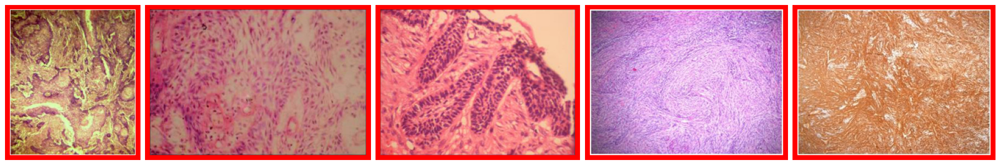

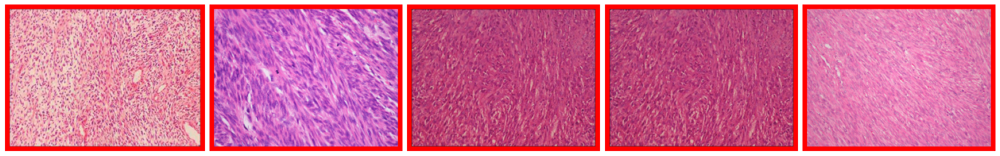

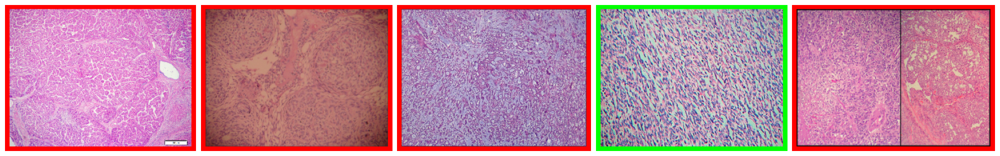

In [4]:
import os
import ot
import cv2
import csv
import numpy as np
import torch
import random
from PIL import Image
import matplotlib.pyplot as plt

def compareV2(result_x, result_y, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    
    _all = np.logical_and(_gt_ind_x > _gt_ind_y, _gt_ind_y < topk)
    indices = np.where(_all==1)

    return indices[0]

def compare_triplet(result_x, result_y, result_z, gt, topk=5):
    """
        return retrieval results that right for result_x but wrong for result_y
        ### written @20241114 by panzx 

        input:
            result_x: np.ndarray -> N_img x M_txt
            result_y: np.ndarray -> N_img x M_txt
            gt: np.ndarray -> N_img x M_txt
            topk: int -> topk image for visualization
        output:
            ans: np.ndarray -> logical result of comparison
    """
    ## ranking order of each element for image to text retrieval
    _ranking_x = np.argsort(np.argsort(result_x, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_x
    _ranking_y = np.argsort(np.argsort(result_y, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_y
    _ranking_z = np.argsort(np.argsort(result_z, axis=0)[::-1], axis=0)  # Indices of sorted elements in result_z

    _gt_ind_x = _ranking_x[gt == 1]
    _gt_ind_y = _ranking_y[gt == 1]
    _gt_ind_z = _ranking_z[gt == 1]
    
    _all = (_gt_ind_x > _gt_ind_y)*(_gt_ind_y > _gt_ind_z)*(_gt_ind_z < topk)
    indices = np.where(_all==1)

    return indices[0]

def plot(raw_imgs, labels, w_step=0.005, h_step=0.01, fix_width=True, show=False):
    ratios = list()
    imgs = list()
    img_size = 240
    plot_size = 256
    pad = (plot_size-img_size)//2
    ws=list()
    for i,img in enumerate(raw_imgs):
        h,w,_ = img.shape
        img = cv2.resize(img,(int(img_size*w/h),img_size))

        # color = [0,255,0] if labels[i] else [255,0,0]
        # border_img = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_CONSTANT, value=color)

        h_new,w_new,_ = img.shape
        border_img = np.zeros((h_new+pad*2, w_new+pad*2, 3), dtype=np.uint8)
        border_img[:] = [0,255,0] if labels[i] else [255,0,0]
        border_img[pad:pad+h_new, pad:pad+w_new, :] = img[:,:,:3]
        
        ## debug
        # print(labels[i])
        # plt.figure()
        # plt.imshow(border_img)
        
        imgs.append(border_img)
        h,w,_ = border_img.shape
        ws.append(w)
    rects = list()
    l = 0
    r = (1-w_step*(len(raw_imgs)+1))
    high = 1-h_step*2
    for w in ws:
        wide = r*w/sum(ws)
        rects.append([l+w_step,h_step,wide,high])
        l = l+w_step+wide
    if fix_width:
        f_w = 20
        f_h = f_w*r*plot_size/(sum(ws)*high)
    else:
        f_h = 4
        f_w = f_h*sum(ws)*high/(r*plot_size)
    # plt.figure(figsize=(f_w,f_h))
    fig = plt.figure(figsize=(f_w,f_h,))
    for i,rect in enumerate(rects):
        ax = plt.axes(rect)
        ax = plt.imshow(imgs[i])
        plt.axis("off")
    if show:plt.show()
    return fig

def otnorm(sims, tau=0.01):
    r = np.ones(sims.shape[0])
    c = np.ones(sims.shape[1])
    P = ot.sinkhorn(r,c,1-sims,reg=tau)
    return P

def isnorm(x, tau, axis):
    """Compute softmax values for each sets of scores in x."""
    ## 1: na\ive formulation
    return np.exp(x/tau) / np.sum(np.exp(x/tau), axis=axis, keepdims=True)

## annotations 
prefix = "/home/panzx/retrieval/HubnessOT/Medical_Retrieval/visualization/"
dataset = "pubmed_set"
anno_path = prefix+"%s_anno.csv"%dataset
with open(anno_path, mode='r') as file:
    reader = csv.reader(file)
    annos = [line for line in reader]


## similarities
sims_path =  prefix+"%s_sims.pt"%dataset
books_sims = torch.load(sims_path)

## ground truth
cpi = 5 # captions per image
m,n = books_sims.shape
_range = torch.arange(n).unsqueeze(dim=1).repeat(1,m)
_lower = (torch.arange(m))*cpi
_upper = (torch.arange(m)+1)*cpi
_gt = (_lower<=_range) * (_range<_upper)
gt = _gt.t().type(torch.float)

## compare
books_is_sims = isnorm(books_sims, tau=1, axis=1)
books_ot_sims = otnorm(books_sims) 

t2i = compare_triplet(books_sims, books_is_sims, books_ot_sims, gt)

## t2i 
topk=5
for t,id in enumerate(t2i):
    _,t2i_ids_bl = torch.tensor(books_sims)[:,id].topk(k=topk, dim=0, largest=True) # baseline
    _,t2i_ids_is = torch.tensor(books_is_sims)[:,id].topk(k=topk, dim=0, largest=True) # invetted softmax
    _,t2i_ids_sn = torch.tensor(books_ot_sims)[:,id].topk(k=topk, dim=0, largest=True) # sinkhorn normalization

    caption = annos[id][1]
    print(caption)
    ims_bl = [np.array(Image.open(annos[i][0])) for i in t2i_ids_bl]
    ims_is = [np.array(Image.open(annos[i][0])) for i in t2i_ids_is]
    ims_sn = [np.array(Image.open(annos[i][0])) for i in t2i_ids_sn]
    fig_bl = plot(ims_bl, [i==id//5 for i in t2i_ids_bl], show=True)
    fig_bl = plot(ims_is, [i==id//5 for i in t2i_ids_is], show=True)
    fig_sc = plot(ims_sn, [i==id//5 for i in t2i_ids_sn], show=True)
    if t>=0:break